In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pickle
import glob
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

# Camera Calibrations

[]

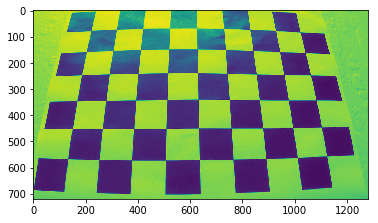

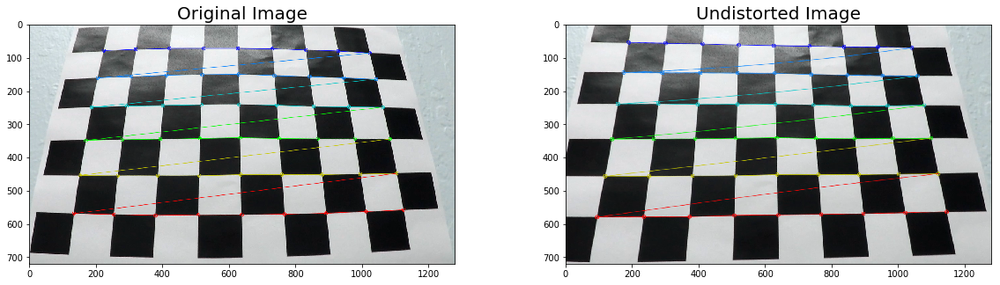

In [2]:
# call cv2 undistor
#def undistort(image, matrix, dis):
#    return cv2.undistort(image, matrix, dis, None, matrix)

nx = 9 # different than the course lecture
ny = 6
objpoints = []
imgpoints = []
# prepare object points, like (0,0,0), (1,0,0), ... 
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

img = cv2.imread('camera_cal/calibration3.jpg') # pick one
plt.imshow(img)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray)

#Finding chessboard corners (for an nx x ny board):
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
# assume ret == True
imgpoints.append(corners)
objpoints.append(objp)
# Drawing detected corners on an image:
cv2.drawChessboardCorners(img, (nx, ny), corners, ret)

# Camera calibration, given object points, image points, and the shape of the grayscale image:
ret, matrix, dist, rvecs, tvecs = \
            cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
# where dist is distortion coefficent
# matrix, camera matrix to transform 3D to 2D image points

# Undistorting a test image:
undistorted = cv2.undistort(img, matrix, dist, None, matrix)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5))                             
ax1.set_title('Original Image', fontsize=20)
ax2.set_title('Undistorted Image', fontsize=20)
ax1.imshow(img)
ax2.imshow(undistorted)
plt.plot()

mkdir: cannot create directory ‘undistorted_folder’: File exists


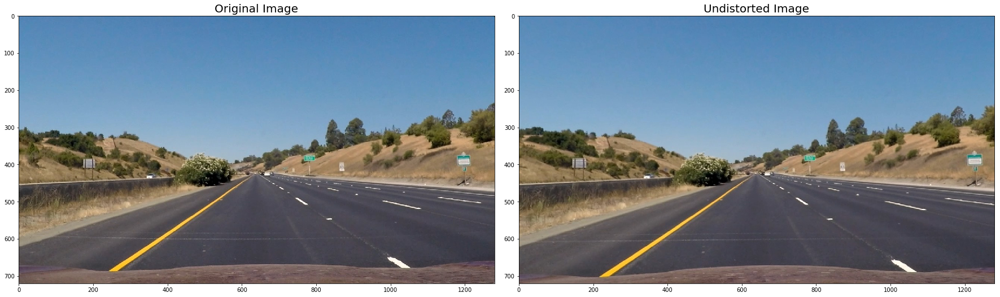

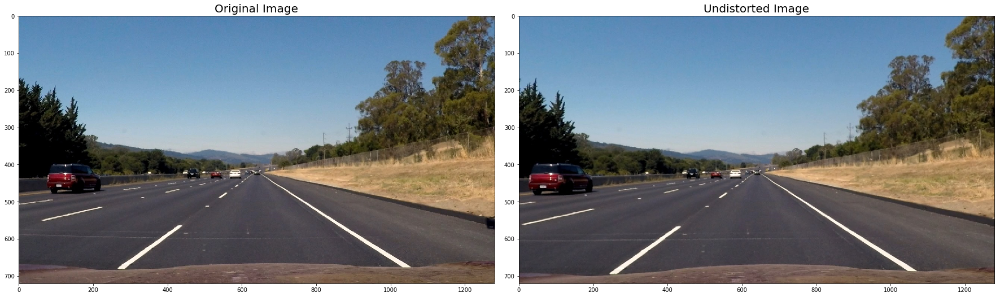

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


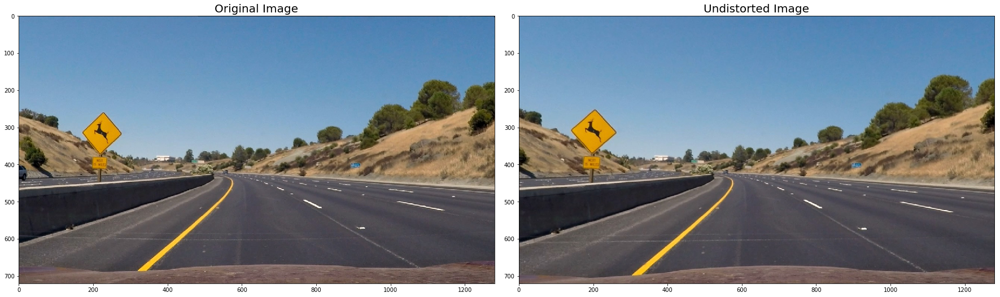

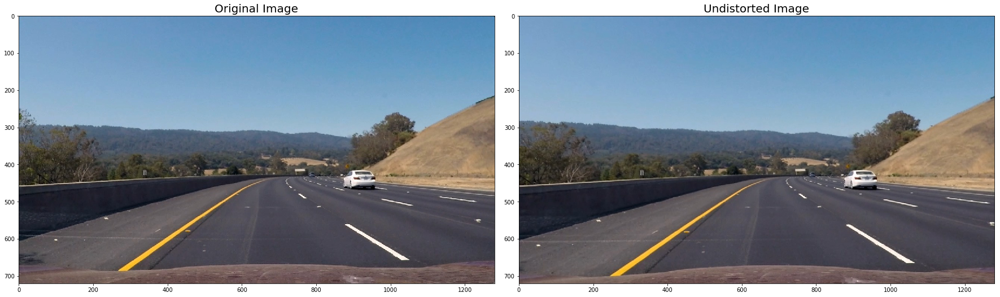

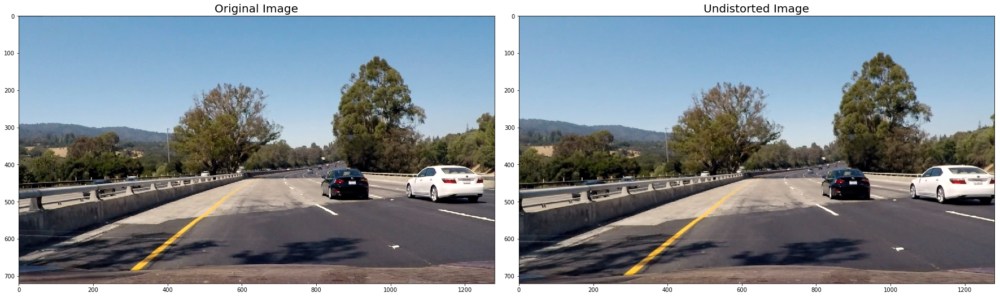

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


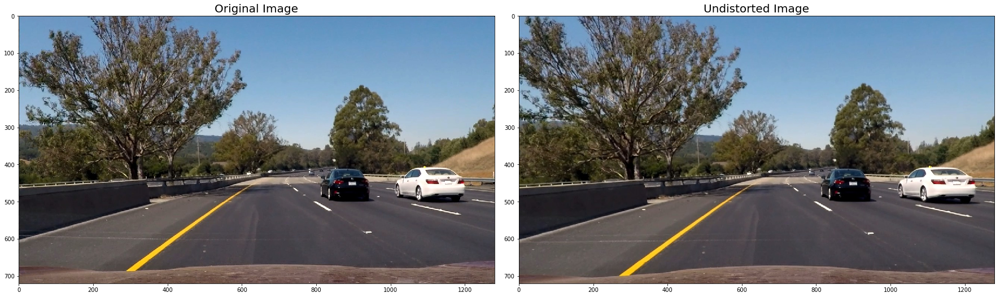

In [3]:
# mkdir system call
%mkdir undistorted_folder 

def save(dire, fname, img):
    #print(fname)
    fname = ''.join([dire,'undistorted_',fname])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.imwrite(fname,img)

images = ['straight_lines1.jpg', 'straight_lines2.jpg',
          'test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', 'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undistorted = cv2.undistort(img, matrix, dist, None, matrix) #undistort(img, matrix, dist)          
    save('undistorted_folder/', fname, undistorted)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

In [4]:
# Code taken from Udacity lecture

# Sobel Absolute Threshold 
def abs_sobel_thresh(img, direction='x', 
                     sobel_kernel=3, thresh=(0, 255)):    
    img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    scaled_sobel = None
    # Sobel x
    if direction == 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        abs_sobelx = np.absolute(sobelx) 
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))  
    # Sobel y
    else:
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) 
        abs_sobely = np.absolute(sobely) 
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
        
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1    
    return sxbinary

In [5]:
# Sobel Magnitude Threshold 
def mag_thresh(img, sobel_kernel=3, 
               mag_thresh=(0, 255)):
    img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    magnitude = np.sqrt(np.square(sobelx)+np.square(sobely))
    abs_magnitude = np.absolute(magnitude)
    scaled_magnitude = np.uint8(255*abs_magnitude/np.max(abs_magnitude))
    mag_binary = np.zeros_like(scaled_magnitude)
    mag_binary[(scaled_magnitude >= mag_thresh[0]) & (scaled_magnitude <= mag_thresh[1])] = 1    
    return mag_binary

In [6]:
# Sobel Direction Threshold
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    arctan = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(arctan)
    dir_binary[(arctan >= thresh[0]) & (arctan <= thresh[1])] = 1    
    return dir_binary

In [7]:
def combined_sobel_gradient_thres(img, disp=False, s_thresh_min=150, s_thresh_max=255):    
    ksize = 3     # Sobel kernel size
    gradx = abs_sobel_thresh(img, direction='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(img, direction='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.4))    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1))|((mag_binary == 1) & (dir_binary == 1))] = 1    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1    
    combined_binary = np.zeros_like(combined)    
    combined_binary[(s_binary == 1) | (combined == 1)] = 1  
    fs = 30 # font size
    if disp == True:
        f, (ax1, ax2) = plt.subplots(2, 2, figsize=(40,20))
        ax1[0].set_title('Original Image', fontsize=20)
        ax1[0].imshow(img)
        ax1[1].set_title('Combined gradx, grady, mag, dir', fontsize=fs)
        ax1[1].imshow(combined, cmap='gray')
        ax2[0].set_title('Color Thresholding', fontsize=fs)
        ax2[0].imshow(s_binary, cmap='gray')
        ax2[1].set_title('Combined S Binary', fontsize=fs)
        ax2[1].imshow(combined_binary, cmap='gray')        
    return combined_binary, img, combined, s_binary

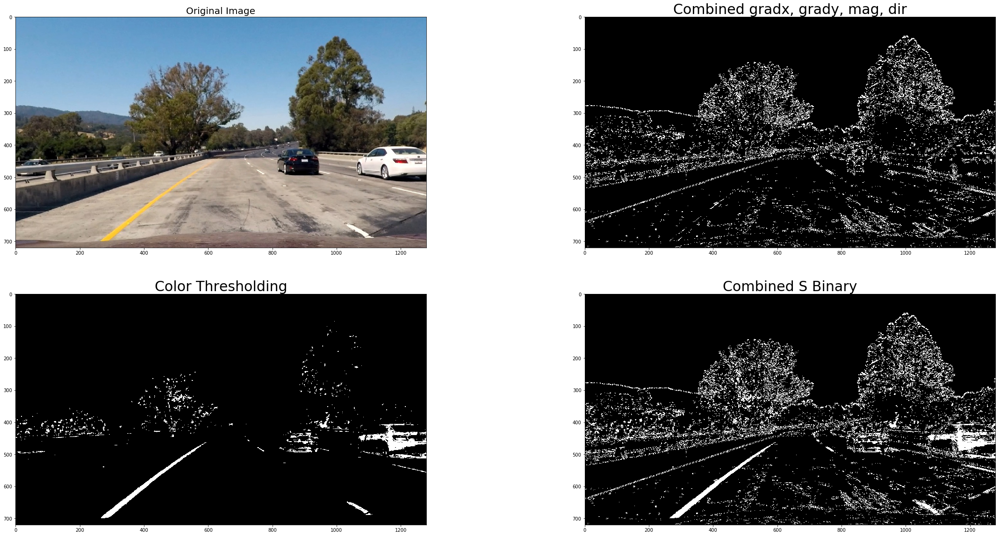

In [8]:
# check the plots
"""
img = 'undistorted_folder/undistorted_test6.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
img = 'undistorted_folder/undistorted_test2.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
img = 'undistorted_folder/undistorted_test5.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
"""
#img = 'undistorted_folder/undistorted_straight_lines1.jpg'
img = 'undistorted_folder/undistorted_test1.jpg'
img = cv2.imread(img)
combined_binary, img_color, combined_1, s_binary = combined_sobel_gradient_thres(img, disp=True)

In [9]:
def transform_image_warp(img, nx, ny): 
    offset = 100 # offset for dst points
    #type(img)
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])    
    #print(imgsz)
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)    
    return warped, M


def display_transformed_image(combined_binary, warped_img):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(combined_binary, cmap='gray')
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(warped_img,cmap='gray')
    ax2.set_title('Warped Image', fontsize=30)    
    plt.show()

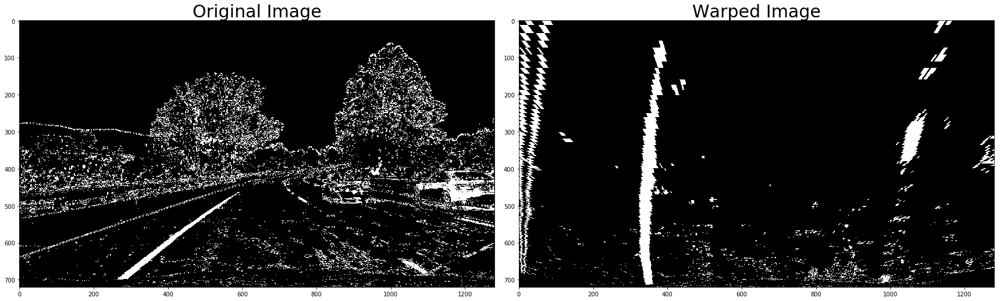

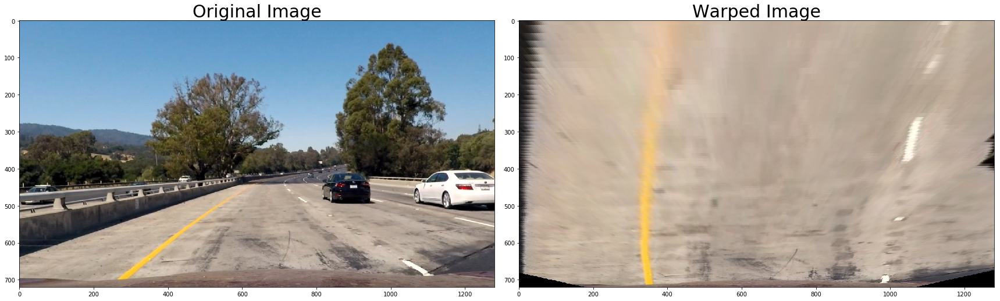

"\nimg1 = 'undistorted_folder/undistorted_test5.jpg'\nimg1 = cv2.imread(img1)\ncombined_binary_1, _, _, _ = combined_sobel_gradient_thres(img1, disp=False)\nwarped_img_1, M_1 = transform_image_warp(combined_binary_1, nx, ny) \ndisplay_transformed_image(combined_binary_1, warped_img_1)\n"

In [10]:
#warped, M = transform_image(combined_binary, src, dst, matrix) 
warped_img, M = transform_image_warp(combined_binary, nx, ny) 
display_transformed_image(combined_binary, warped_img)

color_warped_img, color_M = transform_image_warp(img_color, nx, ny) 
display_transformed_image(img_color, color_warped_img)

"""
img1 = 'undistorted_folder/undistorted_test5.jpg'
img1 = cv2.imread(img1)
combined_binary_1, _, _, _ = combined_sobel_gradient_thres(img1, disp=False)
warped_img_1, M_1 = transform_image_warp(combined_binary_1, nx, ny) 
display_transformed_image(combined_binary_1, warped_img_1)
"""

In [11]:
# Locating the Lanes
def locating_lanes(binary_warped, nwindows=9, margin=100, minpix=50):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []    
    ## Create an image to draw on and an image to show the selection window
    ##out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
     
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit,left_lane_inds, right_lane_inds, nonzerox, nonzeroy, histogram


In [12]:
def display_lanes(left_fit, right_fit, left_lane_inds, 
                  right_lane_inds, binary_warped, 
                  nonzerox, nonzeroy, histogram, margin=50):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]),  (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(binary_warped)
    #plt.imshow(out_img)
    #plt.imshow(result)
    plt.plot(left_fitx, ploty, color='red')
    plt.plot(right_fitx, ploty, color='red')    
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()

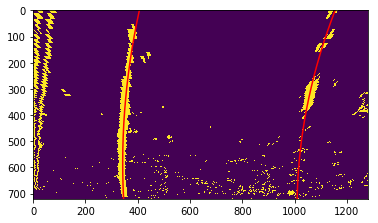

In [13]:
left_fit, right_fit, left_lane_inds, right_lane_inds,\
            nonzerox, nonzeroy, histogram = locating_lanes(warped_img)
    
display_lanes(left_fit, right_fit, left_lane_inds, \
              right_lane_inds, warped_img, nonzerox, nonzeroy, histogram)

......


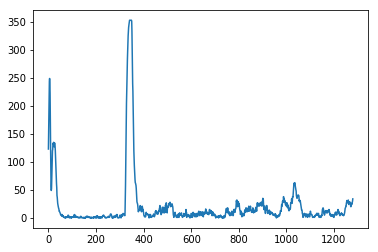

In [14]:
print('......')
plt.plot(histogram)  
plt.show()


# Radius of Curvature & Distance from Lane Center

In [15]:
def radius_curvature_center(binary_img, left_fit, right_fit):        
    ym_per_pix = 30/720 #3.048/100  # meters per pixel in y dimension
    xm_per_pix = 3.7/700 #3.7/380 #3.7/700 # meters per pixel in x dimension
    h = binary_img.shape[0] 
    ploty = np.linspace(0, h-1, h)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y_eval = np.max(ploty)    
    # follow udacity lecture formulat
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)    
    left_curv  = ((1 + (2*left_fit_cr[0] *y_eval*ym_per_pix \
                        + left_fit_cr[1])**2) **1.5) / np.absolute(2*left_fit_cr[0])
    
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)        
    right_curv = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix \
                        + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Calculate vehicle center
    #left_lane and right lane bottom in pixels
    left_lane_bottom = (left_fit[0]*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0]*y_eval)**2 + right_fit[0]*y_eval + right_fit[2]
    
    # Lane center as mid of left and right lane bottom                        
    lane_center = (left_lane_bottom + right_lane_bottom)/2.
    center_image = binary_img.shape[1]/2 #640
    center_dist = (lane_center - center_image) * xm_per_pix #Convert to meters
    return left_curv, right_curv, center_dist

In [16]:
left_curv, right_curv, center = radius_curvature_center(warped_img, left_fit, right_fit)


In [17]:
def draw_on_image(undist, warped_img, left_fit, right_fit, M, \
               left_curv, right_curv, center, show_values = False):    
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image and draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lanes the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    M_inverse = np.linalg.inv(M)
    
    # Warp the blank back to original image space using inverse perspective matrix
    unwarped = cv2.warpPerspective(color_warp, M_inverse, \
                                  (undist.shape[1], img.shape[0])) 
        
    result = cv2.addWeighted(undist, 1, unwarped, 0.3, 0)
    
    cv2.putText(result, 'left curvature: {:.2f} m'.format(left_curv), \
                (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    cv2.putText(result, 'right curvature: {:.2f} m'.format(right_curv), \
                (50, 100), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    lr = ''
    if(center > 0): lr = 'right'
    elif (center<0): lr = 'left'
    else: lr = 'center'
    
    cv2.putText(result, 'vehicle is {:.2f}m {}'.format(abs(center), lr), \
                (50, 150), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    if show_values == True:
        fig, ax = plt.subplots(figsize=(15, 8))
        ax.imshow(result)        
    return result

array([[[ 95, 153, 199],
        [ 95, 153, 199],
        [ 95, 153, 199],
        ..., 
        [ 87, 148, 195],
        [ 87, 148, 195],
        [ 89, 147, 195]],

       [[ 96, 154, 200],
        [ 96, 154, 200],
        [ 96, 154, 200],
        ..., 
        [ 87, 148, 195],
        [ 87, 148, 195],
        [ 89, 147, 195]],

       [[ 95, 153, 199],
        [ 96, 154, 200],
        [ 96, 154, 200],
        ..., 
        [ 87, 148, 195],
        [ 87, 148, 195],
        [ 87, 148, 195]],

       ..., 
       [[117,  93,  91],
        [118,  94,  92],
        [118,  94,  92],
        ..., 
        [120, 101,  97],
        [121, 102,  98],
        [121, 102,  98]],

       [[122,  98,  96],
        [122,  98,  96],
        [121,  97,  95],
        ..., 
        [119, 100,  96],
        [120, 101,  97],
        [120, 101,  97]],

       [[125, 101,  99],
        [125, 101,  99],
        [124, 100,  98],
        ..., 
        [122, 103,  99],
        [123, 104, 100],
        [121, 102,

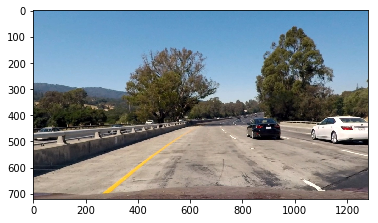

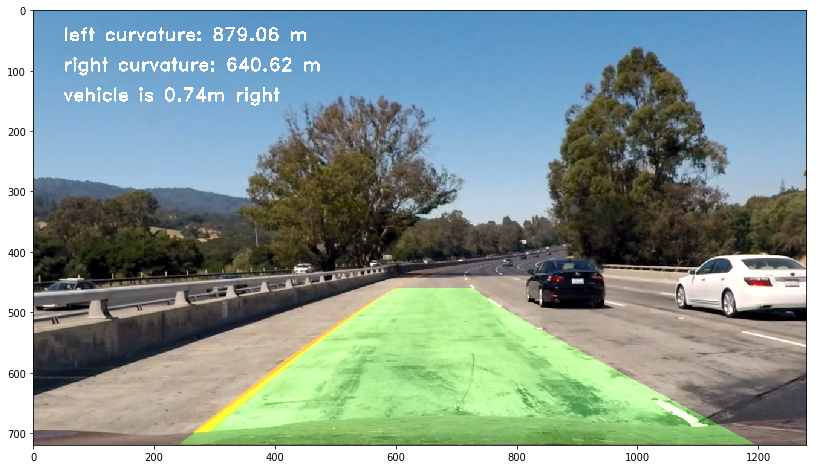

In [18]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
draw_on_image(img, warped_img, left_fit, right_fit, M, left_curv, right_curv, center, True)

# Pipeline

In [19]:
# for pipeline based on time-series images from the video
def locating_lanes_with_prev(left_fit, right_fit, binary_warped):    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                    & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                    & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]    
    left_fit_ = []
    right_fit_ = []    
    if len(leftx) != 0:        
        left_fit_ = np.polyfit(lefty, leftx, 2)    
    if len(rightx) != 0:        
        right_fit_ = np.polyfit(righty, rightx, 2)     
    return left_fit_, right_fit_


def is_good_lane(lane_class):
    status = True
    
    #if(len(lane_class.prev_left_lanes)>0 or len(lane_class.prev_right_lanes)>0):
    if lane_class.nlen_in > 0:
        left_diff = np.sum(np.absolute(lane_class.prev_left_lanes - lane_class.left_fit))
        right_diff = np.sum(np.absolute(lane_class.prev_right_lanes - lane_class.right_fit))        
        thres_margin = 50
        diff_threshold = thres_margin * len(lane_class.prev_right_lanes)
        if left_diff > diff_threshold or right_diff > diff_threshold:
            print(diff_threshold, left_diff, right_diff)
            status = False
    else:
        status = True
    return status

"""
def is_good_lane(left_fit, right_fit):    
    
    #Check if left and right fit returned a value
    if len(left_fit) ==0 or len(right_fit) == 0:
        status = False
    else:
        #Check distance b/w lines
        ploty = np.linspace(0, 20, num=10 )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        delta_lines = np.mean(right_fitx - left_fitx)
        if delta_lines >= 150 and delta_lines <=430: 
            status = True
        else:
            status = False
        
        # Calculate slope of left and right lanes at midpoint of y (i.e. 360)
        left = 2*left_fit[0]*360+left_fit[1]
        right = 2*right_fit[0]*360+right_fit[1]
        delta_slope_mid =  np.abs(left-right)
        
        #Check if lines are parallel at the middle
        if delta_slope_mid <= 0.1:
            status = True
        else:
            status = False

    return status, delta_lines, delta_slope_mid
"""    

'\ndef is_good_lane(left_fit, right_fit):    \n    \n    #Check if left and right fit returned a value\n    if len(left_fit) ==0 or len(right_fit) == 0:\n        status = False\n    else:\n        #Check distance b/w lines\n        ploty = np.linspace(0, 20, num=10 )\n        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]\n        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]\n        delta_lines = np.mean(right_fitx - left_fitx)\n        if delta_lines >= 150 and delta_lines <=430: \n            status = True\n        else:\n            status = False\n        \n        # Calculate slope of left and right lanes at midpoint of y (i.e. 360)\n        left = 2*left_fit[0]*360+left_fit[1]\n        right = 2*right_fit[0]*360+right_fit[1]\n        delta_slope_mid =  np.abs(left-right)\n        \n        #Check if lines are parallel at the middle\n        if delta_slope_mid <= 0.1:\n            status = True\n        else:\n            status = Fal

In [20]:
# create a global data structure to store the time-series images
class Laneline():
    def __init__(self):
        self.last_left = None
        self.last_right = None
        self.left_fit = None
        self.right_fit = None
        self.count = 0 
        self.histograms = None
        self.prev_left_lanes = []
        self.prev_right_lanes = []
        self.bad_count = 0
        self.nlen = 50 # buffer size
        self.nlen_in = 0
        #self.current_left_lanes = None
        #self.current_right_lane = None
        

In [21]:
lane = Laneline()

def find_lanes(img):    
    img = cv2.undistort(img, matrix, dist, None, matrix)
    combined_binary, _, _, _ = combined_sobel_gradient_thres(img)
    warped_img, M = transform_image_warp(combined_binary, nx, ny) 
    #print('lane counter --> ', lane.counter)
    if lane.count == 0:
        lane.left_fit, lane.right_fit, left_lane_inds,\
                right_lane_inds, nonzerox, nonzeroy, lane.histograms = locating_lanes(warped_img)
        #lane.count += 1    
    else:
        lane.left_fit, lane.right_fit  = \
                locating_lanes_with_prev(lane.left_fit, lane.right_fit, warped_img)        
    
    #print(lane.left_fit, lane.right_fit)
    #return warped_img, lane.left_fit, lane.right_fit, M
    #status, delta_l, delta_s = is_good_lane(lane.left_fit, lane.right_fit)
    status = is_good_lane(lane)
    print(status)
    #, delta_l, delta_s)
    if status == True:
        bad_count = 0
        lane.prev_left_lanes.append(lane.left_fit)
        lane.prev_right_lanes.append(lane.right_fit)
        nlen = lane.nlen
        lane.nlen_in += 1
        if lane.nlen_in > nlen: #len(lane.prev_right_lanes) > nlen:
            lane.prev_right_lanes = lane.prev_right_lanes[-nlen::]
            #self.nlen_in = nlen
        #if len(lane.prev_left_lanes) > nlen:
            lane.prev_left_lanes = lane.prev_left_lanes[-nlen::]
            lane.nlen_in = nlen
        #print(lane.prev_right_lanes)
        #print(len(lane.prev_left_lanes))#, lane.prev_right_lanes)
    else:
        lane.bad_count += 1
        right_ls = lane.prev_right_lanes[0]
        len_rls = len(lane.prev_right_lanes)
        for i in range(1, len_rls):
            right_ls = np.add(right_ls, lane.prev_right_lanes[i])
            
        left_ls = lane.prev_left_lanes[0]
        len_lls = len(lane.prev_left_lanes)
        for i in range(1, len_lls):
            left_ls = np.add(left_ls, lane.prev_left_lanes[i])
        lane.left_fit = left_ls / len_lls
        lane.right_fit = right_ls / len_rls
        
    if lane.bad_count >= 30:
        print('clear bad lanes')
        lane.bad_count = 0
        lane.prev_left_lanes = []
        lane.prev_right_lanes = []
        lane.nlen_in = 0
    return warped_img, lane.left_fit, lane.right_fit, M

True
True
100 210.779514757 284.600273978
False
100 124.433333498 130.746212995
False
100 360.957004568 304.424697635
False
100 188.113227675 333.522447507
False
100 113.495597675 97.3886556137
False
100 384.11279052 373.852084128
False


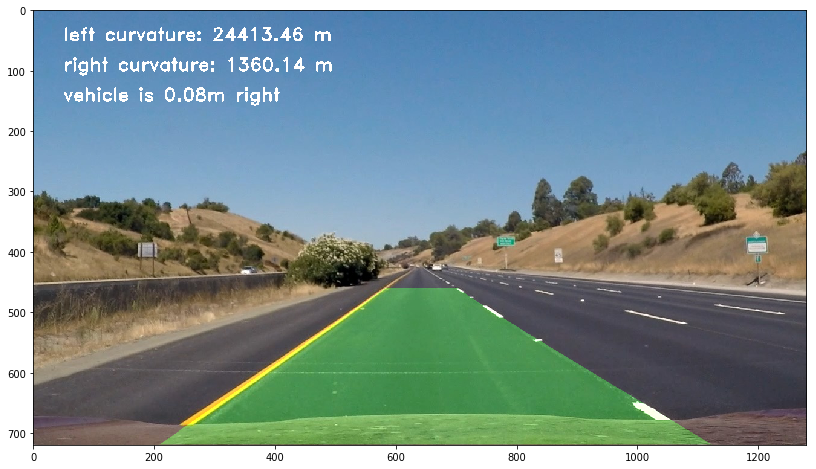

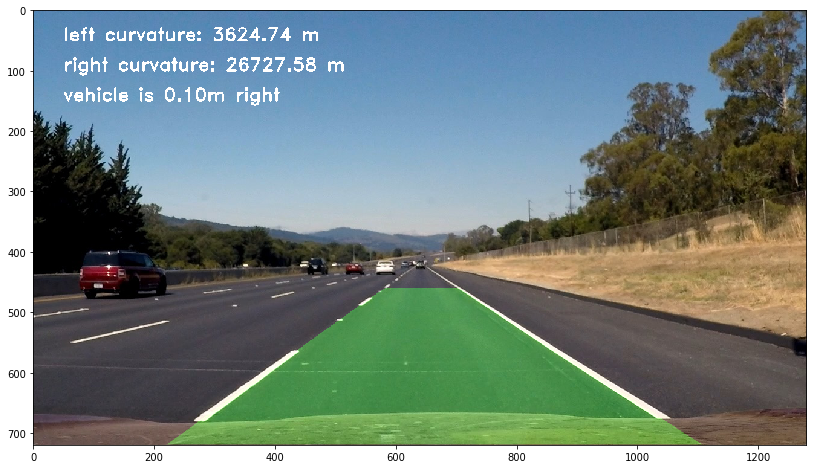

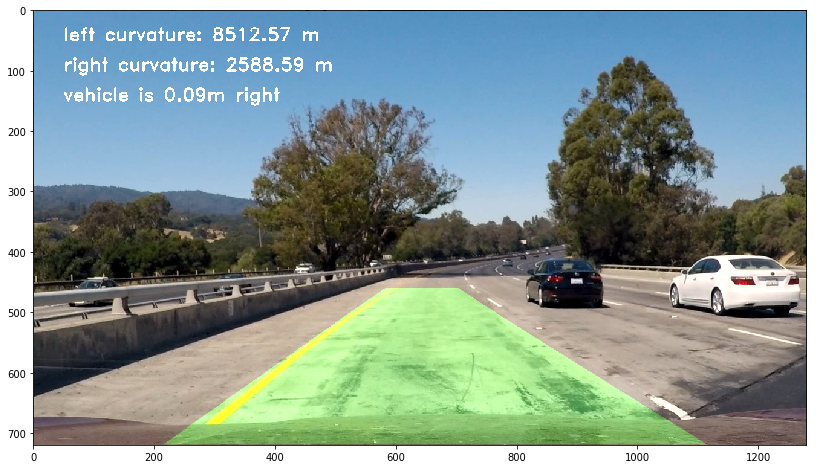

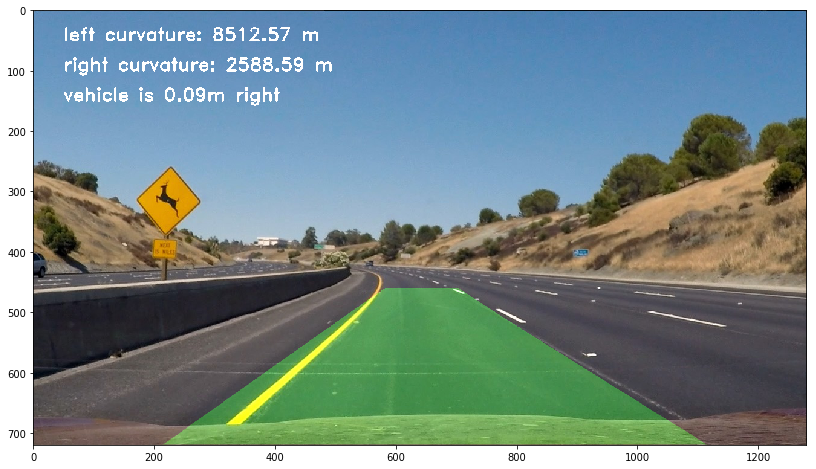

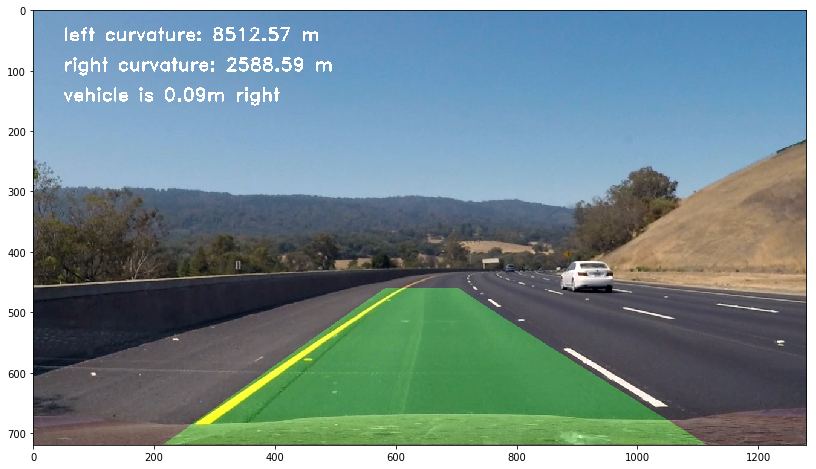

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


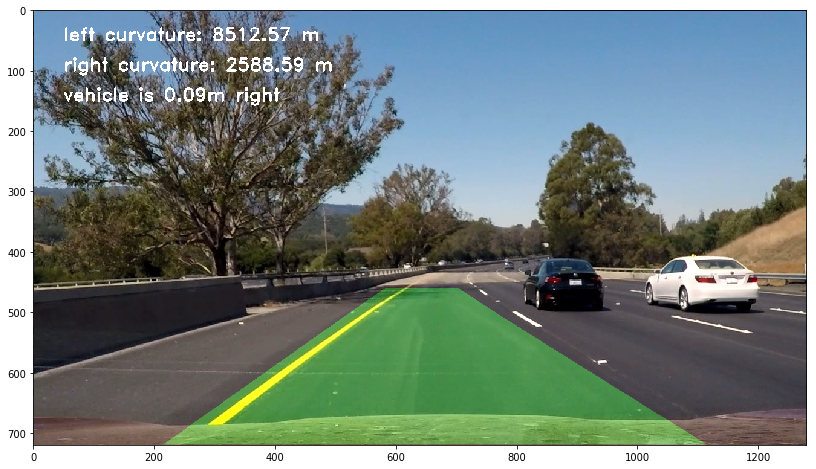

In [22]:
def pipeline(img, show_values=False):
    warped_img, left_fit, right_fit, M = find_lanes(img)    
    left_curvature, right_curvature, center = \
            radius_curvature_center(warped_img, left_fit, right_fit)
    return draw_on_image(img, warped_img, left_fit,\
                         right_fit, M, left_curvature, right_curvature, center, show_values)
    
images = ['straight_lines1.jpg', 'straight_lines2.jpg',\
          'test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', \
          'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pipeline(img, True)

# Video Generations

In [23]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML 
lane = Laneline()
def process_video(img):
    return pipeline(img)

%mkdir videos

mkdir: cannot create directory ‘videos’: File exists


In [24]:
output_file = 'videos/project_video_output.mp4'
clip = VideoFileClip("project_video.mp4")
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)

True
[MoviePy] >>>> Building video videos/project_video_output.mp4
[MoviePy] Writing video videos/project_video_output.mp4


  0%|          | 1/1261 [00:00<04:41,  4.47it/s]

True


  0%|          | 2/1261 [00:00<04:58,  4.21it/s]

True


  0%|          | 3/1261 [00:00<04:57,  4.23it/s]

True


  0%|          | 4/1261 [00:00<04:56,  4.23it/s]

True


  0%|          | 5/1261 [00:01<04:55,  4.25it/s]

True


  0%|          | 6/1261 [00:01<04:54,  4.27it/s]

True


  1%|          | 7/1261 [00:01<04:53,  4.27it/s]

True


  1%|          | 8/1261 [00:01<04:53,  4.27it/s]

True


  1%|          | 9/1261 [00:02<04:51,  4.30it/s]

True


  1%|          | 10/1261 [00:02<04:53,  4.27it/s]

True


  1%|          | 11/1261 [00:02<04:49,  4.32it/s]

True


  1%|          | 12/1261 [00:02<04:48,  4.32it/s]

True


  1%|          | 13/1261 [00:03<04:49,  4.31it/s]

True


  1%|          | 14/1261 [00:03<04:47,  4.34it/s]

True


  1%|          | 15/1261 [00:03<04:46,  4.35it/s]

True


  1%|▏         | 16/1261 [00:03<04:51,  4.28it/s]

800 139.817249171 892.854172503
False


  1%|▏         | 17/1261 [00:03<04:53,  4.24it/s]

800 178.573858139 833.354683304
False


  1%|▏         | 18/1261 [00:04<04:48,  4.31it/s]

800 168.48660894 803.860393643
False


  2%|▏         | 19/1261 [00:04<04:48,  4.30it/s]

True


  2%|▏         | 20/1261 [00:04<04:46,  4.33it/s]

True


  2%|▏         | 21/1261 [00:04<04:48,  4.30it/s]

True


  2%|▏         | 22/1261 [00:05<04:47,  4.30it/s]

True


  2%|▏         | 23/1261 [00:05<04:43,  4.36it/s]

True


  2%|▏         | 24/1261 [00:05<04:40,  4.41it/s]

True


  2%|▏         | 25/1261 [00:05<04:46,  4.31it/s]

True


  2%|▏         | 26/1261 [00:06<04:45,  4.33it/s]

True


  2%|▏         | 27/1261 [00:06<04:44,  4.33it/s]

True


  2%|▏         | 28/1261 [00:06<04:47,  4.29it/s]

True


  2%|▏         | 29/1261 [00:06<04:45,  4.32it/s]

True


  2%|▏         | 30/1261 [00:06<04:47,  4.28it/s]

True


  2%|▏         | 31/1261 [00:07<04:49,  4.25it/s]

True


  3%|▎         | 32/1261 [00:07<04:48,  4.25it/s]

True


  3%|▎         | 33/1261 [00:07<04:46,  4.29it/s]

True


  3%|▎         | 34/1261 [00:07<04:46,  4.29it/s]

True


  3%|▎         | 35/1261 [00:08<04:43,  4.32it/s]

True


  3%|▎         | 36/1261 [00:08<04:41,  4.36it/s]

True


  3%|▎         | 37/1261 [00:08<04:41,  4.34it/s]

True


  3%|▎         | 38/1261 [00:08<04:42,  4.33it/s]

True


  3%|▎         | 39/1261 [00:09<04:41,  4.33it/s]

1800 392.997437812 2240.89022367
False


  3%|▎         | 40/1261 [00:09<04:41,  4.33it/s]

1800 520.037686323 2201.19647238
False


  3%|▎         | 41/1261 [00:09<04:41,  4.33it/s]

1800 632.013703228 2308.74636957
False


  3%|▎         | 42/1261 [00:09<04:40,  4.35it/s]

1800 514.190788522 2118.79020152
False


  3%|▎         | 43/1261 [00:10<04:50,  4.20it/s]

True


  3%|▎         | 44/1261 [00:10<04:43,  4.29it/s]

True


  4%|▎         | 45/1261 [00:10<04:45,  4.25it/s]

True


  4%|▎         | 46/1261 [00:10<04:42,  4.30it/s]

True


  4%|▎         | 47/1261 [00:10<04:42,  4.30it/s]

True


  4%|▍         | 48/1261 [00:11<04:43,  4.28it/s]

True


  4%|▍         | 49/1261 [00:11<04:41,  4.30it/s]

True


  4%|▍         | 50/1261 [00:11<04:41,  4.30it/s]

True


  4%|▍         | 51/1261 [00:11<04:46,  4.23it/s]

True


  4%|▍         | 52/1261 [00:12<04:48,  4.19it/s]

True


  4%|▍         | 53/1261 [00:12<04:45,  4.24it/s]

True


  4%|▍         | 54/1261 [00:12<04:49,  4.17it/s]

2350 1006.38990895 2751.33058759
False


  4%|▍         | 55/1261 [00:12<04:51,  4.14it/s]

2350 987.911026275 2695.50968709
False


  4%|▍         | 56/1261 [00:13<04:52,  4.13it/s]

True


  5%|▍         | 57/1261 [00:13<04:52,  4.11it/s]

True


  5%|▍         | 58/1261 [00:13<04:50,  4.14it/s]

True


  5%|▍         | 59/1261 [00:13<04:51,  4.13it/s]

True


  5%|▍         | 60/1261 [00:14<04:51,  4.12it/s]

2500 669.219033038 3571.34257703
False


  5%|▍         | 61/1261 [00:14<04:53,  4.09it/s]

2500 696.608333638 3035.35730621
False


  5%|▍         | 62/1261 [00:14<04:50,  4.13it/s]

2500 653.493144169 3552.75652427
False


  5%|▍         | 63/1261 [00:14<04:50,  4.12it/s]

2500 617.188587457 3032.11992606
False


  5%|▌         | 64/1261 [00:15<04:50,  4.12it/s]

2500 615.910804982 3388.80340743
False


  5%|▌         | 65/1261 [00:15<04:46,  4.17it/s]

2500 643.467282907 3285.37733869
False


  5%|▌         | 66/1261 [00:15<04:46,  4.17it/s]

2500 615.900587818 3270.52238
False


  5%|▌         | 67/1261 [00:15<04:49,  4.13it/s]

2500 617.454392631 3034.63496425
False


  5%|▌         | 68/1261 [00:15<04:43,  4.21it/s]

True


  5%|▌         | 69/1261 [00:16<04:39,  4.27it/s]

True


  6%|▌         | 70/1261 [00:16<04:44,  4.18it/s]

True


  6%|▌         | 71/1261 [00:16<04:44,  4.19it/s]

True


  6%|▌         | 72/1261 [00:16<04:46,  4.15it/s]

True


  6%|▌         | 73/1261 [00:17<04:41,  4.22it/s]

True


  6%|▌         | 74/1261 [00:17<04:38,  4.26it/s]

True


  6%|▌         | 75/1261 [00:17<04:42,  4.20it/s]

True


  6%|▌         | 76/1261 [00:17<04:44,  4.16it/s]

True


  6%|▌         | 77/1261 [00:18<04:44,  4.17it/s]

True


  6%|▌         | 78/1261 [00:18<04:43,  4.17it/s]

True


  6%|▋         | 79/1261 [00:18<04:47,  4.12it/s]

True


  6%|▋         | 80/1261 [00:18<04:46,  4.13it/s]

True


  6%|▋         | 81/1261 [00:19<04:42,  4.18it/s]

True


  7%|▋         | 82/1261 [00:19<04:38,  4.23it/s]

True


  7%|▋         | 83/1261 [00:19<04:42,  4.17it/s]

True


  7%|▋         | 84/1261 [00:19<04:49,  4.06it/s]

True


  7%|▋         | 85/1261 [00:20<04:42,  4.16it/s]

True


  7%|▋         | 86/1261 [00:20<04:37,  4.23it/s]

True


  7%|▋         | 87/1261 [00:20<04:38,  4.22it/s]

True


  7%|▋         | 88/1261 [00:20<04:38,  4.21it/s]

True


  7%|▋         | 89/1261 [00:21<04:39,  4.20it/s]

True


  7%|▋         | 90/1261 [00:21<04:36,  4.23it/s]

True


  7%|▋         | 91/1261 [00:21<04:38,  4.20it/s]

True


  7%|▋         | 92/1261 [00:21<04:40,  4.17it/s]

True


  7%|▋         | 93/1261 [00:21<04:43,  4.12it/s]

True


  7%|▋         | 94/1261 [00:22<04:40,  4.16it/s]

True


  8%|▊         | 95/1261 [00:22<04:37,  4.21it/s]

True


  8%|▊         | 96/1261 [00:22<04:34,  4.24it/s]

True


  8%|▊         | 97/1261 [00:22<04:37,  4.19it/s]

True


  8%|▊         | 98/1261 [00:23<04:33,  4.25it/s]

True


  8%|▊         | 99/1261 [00:23<04:30,  4.29it/s]

True


  8%|▊         | 100/1261 [00:23<04:30,  4.29it/s]

True


  8%|▊         | 101/1261 [00:23<04:36,  4.19it/s]

True


  8%|▊         | 102/1261 [00:24<04:29,  4.30it/s]

True


  8%|▊         | 103/1261 [00:24<04:31,  4.27it/s]

True


  8%|▊         | 104/1261 [00:24<04:31,  4.27it/s]

True


  8%|▊         | 105/1261 [00:24<04:28,  4.30it/s]

True


  8%|▊         | 106/1261 [00:25<04:33,  4.22it/s]

True


  8%|▊         | 107/1261 [00:25<04:28,  4.29it/s]

True


  9%|▊         | 108/1261 [00:25<04:26,  4.33it/s]

True


  9%|▊         | 109/1261 [00:25<04:26,  4.32it/s]

True


  9%|▊         | 110/1261 [00:25<04:26,  4.31it/s]

True


  9%|▉         | 111/1261 [00:26<04:28,  4.28it/s]

True


  9%|▉         | 112/1261 [00:26<04:24,  4.34it/s]

True


  9%|▉         | 113/1261 [00:26<04:26,  4.31it/s]

True


  9%|▉         | 114/1261 [00:26<04:28,  4.27it/s]

True


  9%|▉         | 115/1261 [00:27<04:29,  4.26it/s]

True


  9%|▉         | 116/1261 [00:27<04:24,  4.32it/s]

True


  9%|▉         | 117/1261 [00:27<04:22,  4.36it/s]

True


  9%|▉         | 118/1261 [00:27<04:17,  4.44it/s]

True


  9%|▉         | 119/1261 [00:28<04:23,  4.33it/s]

True


 10%|▉         | 120/1261 [00:28<04:24,  4.31it/s]

True


 10%|▉         | 121/1261 [00:28<04:28,  4.25it/s]

True


 10%|▉         | 122/1261 [00:28<04:28,  4.24it/s]

True


 10%|▉         | 123/1261 [00:28<04:30,  4.21it/s]

True


 10%|▉         | 124/1261 [00:29<04:24,  4.29it/s]

True


 10%|▉         | 125/1261 [00:29<04:25,  4.28it/s]

True


 10%|▉         | 126/1261 [00:29<04:24,  4.30it/s]

True


 10%|█         | 127/1261 [00:29<04:24,  4.29it/s]

True


 10%|█         | 128/1261 [00:30<04:19,  4.37it/s]

True


 10%|█         | 129/1261 [00:30<04:19,  4.35it/s]

True


 10%|█         | 130/1261 [00:30<04:19,  4.36it/s]

True


 10%|█         | 131/1261 [00:30<04:22,  4.30it/s]

True


 10%|█         | 132/1261 [00:31<04:26,  4.24it/s]

True


 11%|█         | 133/1261 [00:31<04:22,  4.30it/s]

True


 11%|█         | 134/1261 [00:31<04:22,  4.30it/s]

True


 11%|█         | 135/1261 [00:31<04:26,  4.23it/s]

True


 11%|█         | 136/1261 [00:32<04:25,  4.24it/s]

True


 11%|█         | 137/1261 [00:32<04:25,  4.23it/s]

True


 11%|█         | 138/1261 [00:32<04:25,  4.23it/s]

True


 11%|█         | 139/1261 [00:32<04:26,  4.22it/s]

True


 11%|█         | 140/1261 [00:32<04:30,  4.15it/s]

True


 11%|█         | 141/1261 [00:33<04:25,  4.21it/s]

True


 11%|█▏        | 142/1261 [00:33<04:23,  4.24it/s]

True


 11%|█▏        | 143/1261 [00:33<04:29,  4.14it/s]

True


 11%|█▏        | 144/1261 [00:33<04:30,  4.13it/s]

True


 11%|█▏        | 145/1261 [00:34<04:22,  4.25it/s]

True


 12%|█▏        | 146/1261 [00:34<04:22,  4.25it/s]

True


 12%|█▏        | 147/1261 [00:34<04:21,  4.25it/s]

True


 12%|█▏        | 148/1261 [00:34<04:22,  4.24it/s]

True


 12%|█▏        | 149/1261 [00:35<04:27,  4.16it/s]

True


 12%|█▏        | 150/1261 [00:35<04:26,  4.16it/s]

True


 12%|█▏        | 151/1261 [00:35<04:29,  4.12it/s]

True


 12%|█▏        | 152/1261 [00:35<04:28,  4.13it/s]

True


 12%|█▏        | 153/1261 [00:36<04:26,  4.15it/s]

True


 12%|█▏        | 154/1261 [00:36<04:26,  4.16it/s]

True


 12%|█▏        | 155/1261 [00:36<04:24,  4.18it/s]

True


 12%|█▏        | 156/1261 [00:36<04:20,  4.25it/s]

True


 12%|█▏        | 157/1261 [00:37<04:20,  4.24it/s]

True


 13%|█▎        | 158/1261 [00:37<04:17,  4.28it/s]

True


 13%|█▎        | 159/1261 [00:37<04:22,  4.21it/s]

True


 13%|█▎        | 160/1261 [00:37<04:22,  4.20it/s]

True


 13%|█▎        | 161/1261 [00:37<04:23,  4.18it/s]

True


 13%|█▎        | 162/1261 [00:38<04:21,  4.21it/s]

True


 13%|█▎        | 163/1261 [00:38<04:22,  4.19it/s]

True


 13%|█▎        | 164/1261 [00:38<04:18,  4.24it/s]

True


 13%|█▎        | 165/1261 [00:38<04:21,  4.19it/s]

True


 13%|█▎        | 166/1261 [00:39<04:19,  4.22it/s]

True


 13%|█▎        | 167/1261 [00:39<04:17,  4.24it/s]

True


 13%|█▎        | 168/1261 [00:39<04:17,  4.25it/s]

True


 13%|█▎        | 169/1261 [00:39<04:18,  4.22it/s]

True


 13%|█▎        | 170/1261 [00:40<04:14,  4.29it/s]

True


 14%|█▎        | 171/1261 [00:40<04:17,  4.24it/s]

True


 14%|█▎        | 172/1261 [00:40<04:14,  4.28it/s]

True


 14%|█▎        | 173/1261 [00:40<04:15,  4.25it/s]

True


 14%|█▍        | 174/1261 [00:41<04:11,  4.33it/s]

True


 14%|█▍        | 175/1261 [00:41<04:14,  4.27it/s]

True


 14%|█▍        | 176/1261 [00:41<04:11,  4.31it/s]

2500 1044.82734851 3429.5987032
False


 14%|█▍        | 177/1261 [00:41<04:09,  4.35it/s]

2500 1269.02458074 2530.4226039
False


 14%|█▍        | 178/1261 [00:41<04:11,  4.31it/s]

True


 14%|█▍        | 179/1261 [00:42<04:14,  4.24it/s]

True


 14%|█▍        | 180/1261 [00:42<04:13,  4.26it/s]

True


 14%|█▍        | 181/1261 [00:42<04:15,  4.23it/s]

True


 14%|█▍        | 182/1261 [00:42<04:14,  4.25it/s]

True


 15%|█▍        | 183/1261 [00:43<04:12,  4.26it/s]

True


 15%|█▍        | 184/1261 [00:43<04:08,  4.34it/s]

True


 15%|█▍        | 185/1261 [00:43<04:05,  4.38it/s]

True


 15%|█▍        | 186/1261 [00:43<04:08,  4.33it/s]

2500 866.438113463 4033.75132071
False


 15%|█▍        | 187/1261 [00:44<04:11,  4.26it/s]

2500 883.299914527 4373.66945897
False


 15%|█▍        | 188/1261 [00:44<04:16,  4.18it/s]

2500 853.490185817 4685.91823581
False


 15%|█▍        | 189/1261 [00:44<04:13,  4.23it/s]

2500 833.06428684 4394.81592898
False


 15%|█▌        | 190/1261 [00:44<04:11,  4.26it/s]

2500 868.930734738 4243.26414592
False


 15%|█▌        | 191/1261 [00:44<04:11,  4.25it/s]

2500 836.269328914 4023.05746081
False


 15%|█▌        | 192/1261 [00:45<04:11,  4.25it/s]

2500 844.420337506 3385.34915422
False


 15%|█▌        | 193/1261 [00:45<04:13,  4.21it/s]

2500 846.620233506 4231.32868274
False


 15%|█▌        | 194/1261 [00:45<04:12,  4.23it/s]

2500 826.936785765 3774.78499445
False


 15%|█▌        | 195/1261 [00:45<04:15,  4.17it/s]

2500 834.672610745 4150.19366272
False


 16%|█▌        | 196/1261 [00:46<04:12,  4.22it/s]

True


 16%|█▌        | 197/1261 [00:46<04:08,  4.28it/s]

True


 16%|█▌        | 198/1261 [00:46<04:07,  4.29it/s]

True


 16%|█▌        | 199/1261 [00:46<04:09,  4.25it/s]

2500 1743.50700184 3126.32886509
False
clear bad lanes


 16%|█▌        | 200/1261 [00:47<04:09,  4.26it/s]

True


 16%|█▌        | 201/1261 [00:47<04:06,  4.30it/s]

True


 16%|█▌        | 202/1261 [00:47<04:06,  4.30it/s]

True


 16%|█▌        | 203/1261 [00:47<04:10,  4.22it/s]

True


 16%|█▌        | 204/1261 [00:48<04:09,  4.24it/s]

True


 16%|█▋        | 205/1261 [00:48<04:06,  4.29it/s]

True


 16%|█▋        | 206/1261 [00:48<04:07,  4.26it/s]

True


 16%|█▋        | 207/1261 [00:48<04:09,  4.22it/s]

True


 16%|█▋        | 208/1261 [00:49<04:12,  4.17it/s]

400 79.2029822758 440.24253895
False


 17%|█▋        | 209/1261 [00:49<04:09,  4.22it/s]

True


 17%|█▋        | 210/1261 [00:49<04:05,  4.27it/s]

True


 17%|█▋        | 211/1261 [00:49<04:06,  4.26it/s]

True


 17%|█▋        | 212/1261 [00:49<04:07,  4.23it/s]

True


 17%|█▋        | 213/1261 [00:50<04:05,  4.27it/s]

True


 17%|█▋        | 214/1261 [00:50<04:03,  4.30it/s]

True


 17%|█▋        | 215/1261 [00:50<03:59,  4.38it/s]

True


 17%|█▋        | 216/1261 [00:50<03:58,  4.38it/s]

True


 17%|█▋        | 217/1261 [00:51<03:59,  4.36it/s]

True


 17%|█▋        | 218/1261 [00:51<03:58,  4.38it/s]

True


 17%|█▋        | 219/1261 [00:51<04:02,  4.30it/s]

True


 17%|█▋        | 220/1261 [00:51<04:02,  4.29it/s]

True


 18%|█▊        | 221/1261 [00:52<04:04,  4.26it/s]

True


 18%|█▊        | 222/1261 [00:52<04:07,  4.20it/s]

True


 18%|█▊        | 223/1261 [00:52<04:06,  4.21it/s]

True


 18%|█▊        | 224/1261 [00:52<04:06,  4.21it/s]

True


 18%|█▊        | 225/1261 [00:52<04:11,  4.12it/s]

True


 18%|█▊        | 226/1261 [00:53<04:09,  4.15it/s]

True


 18%|█▊        | 227/1261 [00:53<04:10,  4.13it/s]

True


 18%|█▊        | 228/1261 [00:53<04:07,  4.17it/s]

True


 18%|█▊        | 229/1261 [00:53<04:08,  4.15it/s]

True


 18%|█▊        | 230/1261 [00:54<04:05,  4.20it/s]

True


 18%|█▊        | 231/1261 [00:54<04:04,  4.22it/s]

True


 18%|█▊        | 232/1261 [00:54<04:03,  4.23it/s]

True


 18%|█▊        | 233/1261 [00:54<04:05,  4.19it/s]

True


 19%|█▊        | 234/1261 [00:55<04:06,  4.17it/s]

True


 19%|█▊        | 235/1261 [00:55<04:08,  4.13it/s]

True


 19%|█▊        | 236/1261 [00:55<04:06,  4.15it/s]

True


 19%|█▉        | 237/1261 [00:55<04:05,  4.18it/s]

True


 19%|█▉        | 238/1261 [00:56<04:06,  4.16it/s]

1850 418.309221357 2021.21811193
False


 19%|█▉        | 239/1261 [00:56<04:06,  4.15it/s]

1850 361.432474634 2389.59541463
False


 19%|█▉        | 240/1261 [00:56<04:05,  4.16it/s]

1850 355.984365579 1914.24154427
False


 19%|█▉        | 241/1261 [00:56<04:05,  4.15it/s]

1850 435.087483801 1955.09636609
False


 19%|█▉        | 242/1261 [00:57<04:02,  4.20it/s]

True


 19%|█▉        | 243/1261 [00:57<04:01,  4.22it/s]

True


 19%|█▉        | 244/1261 [00:57<04:03,  4.18it/s]

True


 19%|█▉        | 245/1261 [00:57<04:00,  4.22it/s]

2000 360.840605987 2197.0497883
False


 20%|█▉        | 246/1261 [00:58<04:04,  4.16it/s]

2000 344.748543613 2009.95210592
False


 20%|█▉        | 247/1261 [00:58<04:03,  4.17it/s]

True


 20%|█▉        | 248/1261 [00:58<04:01,  4.19it/s]

2050 332.530475545 2744.93607747
False


 20%|█▉        | 249/1261 [00:58<04:04,  4.14it/s]

2050 353.196138059 2502.04747123
False


 20%|█▉        | 250/1261 [00:58<04:02,  4.17it/s]

2050 357.015820343 2851.61551453
False


 20%|█▉        | 251/1261 [00:59<04:04,  4.13it/s]

2050 354.46874646 2293.17084399
False


 20%|█▉        | 252/1261 [00:59<04:08,  4.05it/s]

True


 20%|██        | 253/1261 [00:59<04:06,  4.09it/s]

True


 20%|██        | 254/1261 [00:59<04:02,  4.15it/s]

True


 20%|██        | 255/1261 [01:00<04:04,  4.12it/s]

True


 20%|██        | 256/1261 [01:00<04:01,  4.17it/s]

True


 20%|██        | 257/1261 [01:00<04:02,  4.14it/s]

True


 20%|██        | 258/1261 [01:00<04:05,  4.08it/s]

True


 21%|██        | 259/1261 [01:01<04:08,  4.04it/s]

True


 21%|██        | 260/1261 [01:01<04:04,  4.09it/s]

True


 21%|██        | 261/1261 [01:01<04:03,  4.11it/s]

True


 21%|██        | 262/1261 [01:01<04:09,  4.01it/s]

True


 21%|██        | 263/1261 [01:02<04:08,  4.01it/s]

True


 21%|██        | 264/1261 [01:02<04:06,  4.05it/s]

True


 21%|██        | 265/1261 [01:02<04:00,  4.14it/s]

True


 21%|██        | 266/1261 [01:02<04:05,  4.06it/s]

True


 21%|██        | 267/1261 [01:03<04:06,  4.03it/s]

True


 21%|██▏       | 268/1261 [01:03<04:05,  4.04it/s]

True


 21%|██▏       | 269/1261 [01:03<04:02,  4.09it/s]

2500 1207.65378084 2668.9977572
False


 21%|██▏       | 270/1261 [01:03<04:04,  4.05it/s]

2500 1361.71724278 2670.61468948
False


 21%|██▏       | 271/1261 [01:04<04:07,  4.00it/s]

True


 22%|██▏       | 272/1261 [01:04<04:00,  4.11it/s]

True


 22%|██▏       | 273/1261 [01:04<03:59,  4.13it/s]

True


 22%|██▏       | 274/1261 [01:04<04:02,  4.08it/s]

True


 22%|██▏       | 275/1261 [01:05<04:03,  4.05it/s]

True


 22%|██▏       | 276/1261 [01:05<03:58,  4.13it/s]

True


 22%|██▏       | 277/1261 [01:05<03:59,  4.11it/s]

True


 22%|██▏       | 278/1261 [01:05<03:58,  4.12it/s]

True


 22%|██▏       | 279/1261 [01:06<03:58,  4.12it/s]

2500 2278.60134563 2650.76535623
False


 22%|██▏       | 280/1261 [01:06<03:58,  4.12it/s]

2500 2494.05067471 2800.05629926
False


 22%|██▏       | 281/1261 [01:06<03:53,  4.20it/s]

2500 2696.14656241 2807.66006636
False


 22%|██▏       | 282/1261 [01:06<03:47,  4.30it/s]

2500 2988.87948077 2156.66672603
False


 22%|██▏       | 283/1261 [01:07<03:51,  4.23it/s]

2500 2913.67840575 2573.76702216
False


 23%|██▎       | 284/1261 [01:07<03:51,  4.22it/s]

2500 3207.17601825 3304.39150668
False


 23%|██▎       | 285/1261 [01:07<03:49,  4.26it/s]

2500 3247.89480003 4098.00157774
False


 23%|██▎       | 286/1261 [01:07<03:46,  4.30it/s]

2500 3162.99300905 4680.85455594
False


 23%|██▎       | 287/1261 [01:07<03:51,  4.21it/s]

2500 3407.12654852 3887.40607695
False


 23%|██▎       | 288/1261 [01:08<03:49,  4.24it/s]

2500 3482.98021097 4500.84166774
False


 23%|██▎       | 289/1261 [01:08<03:48,  4.25it/s]

2500 3977.06366904 4075.98254823
False


 23%|██▎       | 290/1261 [01:08<03:47,  4.26it/s]

2500 4056.46395041 4310.56294654
False


 23%|██▎       | 291/1261 [01:08<03:53,  4.15it/s]

2500 4448.01078805 4301.86432748
False


 23%|██▎       | 292/1261 [01:09<03:55,  4.12it/s]

2500 4679.65493541 4460.97925593
False


 23%|██▎       | 293/1261 [01:09<03:57,  4.07it/s]

2500 4702.00130885 4554.02012764
False


 23%|██▎       | 294/1261 [01:09<03:55,  4.11it/s]

2500 4807.02479561 3824.44526051
False


 23%|██▎       | 295/1261 [01:09<03:52,  4.16it/s]

2500 4772.36381783 4169.95743355
False
clear bad lanes


 23%|██▎       | 296/1261 [01:10<03:47,  4.23it/s]

True


 24%|██▎       | 297/1261 [01:10<03:45,  4.28it/s]

True


 24%|██▎       | 298/1261 [01:10<03:47,  4.24it/s]

True


 24%|██▎       | 299/1261 [01:10<03:46,  4.24it/s]

True


 24%|██▍       | 300/1261 [01:11<03:50,  4.17it/s]

True


 24%|██▍       | 301/1261 [01:11<03:48,  4.20it/s]

True


 24%|██▍       | 302/1261 [01:11<03:49,  4.17it/s]

True


 24%|██▍       | 303/1261 [01:11<04:00,  3.98it/s]

True


 24%|██▍       | 304/1261 [01:12<03:57,  4.03it/s]

True


 24%|██▍       | 305/1261 [01:12<04:02,  3.94it/s]

True


 24%|██▍       | 306/1261 [01:12<04:01,  3.96it/s]

True


 24%|██▍       | 307/1261 [01:12<03:55,  4.05it/s]

True


 24%|██▍       | 308/1261 [01:13<03:59,  3.98it/s]

True


 25%|██▍       | 309/1261 [01:13<04:01,  3.95it/s]

True


 25%|██▍       | 310/1261 [01:13<03:56,  4.01it/s]

True


 25%|██▍       | 311/1261 [01:13<03:51,  4.10it/s]

True


 25%|██▍       | 312/1261 [01:14<03:49,  4.14it/s]

True


 25%|██▍       | 313/1261 [01:14<03:46,  4.19it/s]

True


 25%|██▍       | 314/1261 [01:14<03:45,  4.21it/s]

True


 25%|██▍       | 315/1261 [01:14<03:44,  4.21it/s]

True


 25%|██▌       | 316/1261 [01:14<03:46,  4.18it/s]

True


 25%|██▌       | 317/1261 [01:15<03:41,  4.25it/s]

True


 25%|██▌       | 318/1261 [01:15<03:48,  4.13it/s]

True


 25%|██▌       | 319/1261 [01:15<03:41,  4.26it/s]

True


 25%|██▌       | 320/1261 [01:15<03:41,  4.25it/s]

True


 25%|██▌       | 321/1261 [01:16<03:41,  4.24it/s]

True


 26%|██▌       | 322/1261 [01:16<03:42,  4.23it/s]

True


 26%|██▌       | 323/1261 [01:16<03:41,  4.24it/s]

True


 26%|██▌       | 324/1261 [01:16<03:37,  4.30it/s]

True


 26%|██▌       | 325/1261 [01:17<03:38,  4.28it/s]

True


 26%|██▌       | 326/1261 [01:17<03:38,  4.28it/s]

True


 26%|██▌       | 327/1261 [01:17<03:34,  4.35it/s]

True


 26%|██▌       | 328/1261 [01:17<03:37,  4.29it/s]

True


 26%|██▌       | 329/1261 [01:18<03:43,  4.17it/s]

1650 1012.47196183 2056.63739187
False


 26%|██▌       | 330/1261 [01:18<03:46,  4.10it/s]

True


 26%|██▌       | 331/1261 [01:18<03:45,  4.13it/s]

True


 26%|██▋       | 332/1261 [01:18<03:47,  4.09it/s]

True


 26%|██▋       | 333/1261 [01:19<03:48,  4.06it/s]

True


 26%|██▋       | 334/1261 [01:19<03:48,  4.05it/s]

True


 27%|██▋       | 335/1261 [01:19<03:46,  4.08it/s]

True


 27%|██▋       | 336/1261 [01:19<03:44,  4.13it/s]

True


 27%|██▋       | 337/1261 [01:20<03:44,  4.12it/s]

True


 27%|██▋       | 338/1261 [01:20<03:43,  4.12it/s]

True


 27%|██▋       | 339/1261 [01:20<03:39,  4.20it/s]

True


 27%|██▋       | 340/1261 [01:20<03:36,  4.26it/s]

True


 27%|██▋       | 341/1261 [01:20<03:37,  4.23it/s]

True


 27%|██▋       | 342/1261 [01:21<03:35,  4.27it/s]

True


 27%|██▋       | 343/1261 [01:21<03:38,  4.21it/s]

True


 27%|██▋       | 344/1261 [01:21<03:33,  4.29it/s]

True


 27%|██▋       | 345/1261 [01:21<03:33,  4.30it/s]

True


 27%|██▋       | 346/1261 [01:22<03:35,  4.25it/s]

2450 1528.4736331 2611.32958108
False


 28%|██▊       | 347/1261 [01:22<03:35,  4.25it/s]

True


 28%|██▊       | 348/1261 [01:22<03:36,  4.22it/s]

True


 28%|██▊       | 349/1261 [01:22<03:40,  4.13it/s]

True


 28%|██▊       | 350/1261 [01:23<03:41,  4.11it/s]

True


 28%|██▊       | 351/1261 [01:23<03:37,  4.18it/s]

True


 28%|██▊       | 352/1261 [01:23<03:35,  4.22it/s]

True


 28%|██▊       | 353/1261 [01:23<03:37,  4.17it/s]

2500 1120.81318561 2872.45307247
False


 28%|██▊       | 354/1261 [01:24<03:39,  4.12it/s]

2500 1121.98834309 2620.36793617
False


 28%|██▊       | 355/1261 [01:24<03:37,  4.16it/s]

True


 28%|██▊       | 356/1261 [01:24<03:34,  4.23it/s]

2500 1102.09497807 2608.0037616
False


 28%|██▊       | 357/1261 [01:24<03:34,  4.22it/s]

True


 28%|██▊       | 358/1261 [01:25<03:39,  4.12it/s]

True


 28%|██▊       | 359/1261 [01:25<03:36,  4.17it/s]

True


 29%|██▊       | 360/1261 [01:25<03:35,  4.19it/s]

True


 29%|██▊       | 361/1261 [01:25<03:35,  4.18it/s]

True


 29%|██▊       | 362/1261 [01:25<03:37,  4.13it/s]

True


 29%|██▉       | 363/1261 [01:26<03:37,  4.13it/s]

True


 29%|██▉       | 364/1261 [01:26<03:32,  4.23it/s]

True


 29%|██▉       | 365/1261 [01:26<03:32,  4.21it/s]

True


 29%|██▉       | 366/1261 [01:26<03:32,  4.22it/s]

True


 29%|██▉       | 367/1261 [01:27<03:32,  4.21it/s]

True


 29%|██▉       | 368/1261 [01:27<03:33,  4.18it/s]

True


 29%|██▉       | 369/1261 [01:27<03:31,  4.21it/s]

True


 29%|██▉       | 370/1261 [01:27<03:35,  4.13it/s]

True


 29%|██▉       | 371/1261 [01:28<03:34,  4.16it/s]

True


 30%|██▉       | 372/1261 [01:28<03:34,  4.15it/s]

True


 30%|██▉       | 373/1261 [01:28<03:34,  4.14it/s]

True


 30%|██▉       | 374/1261 [01:28<03:38,  4.06it/s]

True


 30%|██▉       | 375/1261 [01:29<03:35,  4.11it/s]

True


 30%|██▉       | 376/1261 [01:29<03:31,  4.18it/s]

True


 30%|██▉       | 377/1261 [01:29<03:30,  4.19it/s]

True


 30%|██▉       | 378/1261 [01:29<03:33,  4.13it/s]

True


 30%|███       | 379/1261 [01:30<03:30,  4.19it/s]

True


 30%|███       | 380/1261 [01:30<03:29,  4.21it/s]

True


 30%|███       | 381/1261 [01:30<03:28,  4.21it/s]

True


 30%|███       | 382/1261 [01:30<03:29,  4.19it/s]

True


 30%|███       | 383/1261 [01:31<03:32,  4.13it/s]

True


 30%|███       | 384/1261 [01:31<03:30,  4.17it/s]

True


 31%|███       | 385/1261 [01:31<03:28,  4.19it/s]

True


 31%|███       | 386/1261 [01:31<03:27,  4.21it/s]

True


 31%|███       | 387/1261 [01:31<03:27,  4.21it/s]

True


 31%|███       | 388/1261 [01:32<03:27,  4.20it/s]

True


 31%|███       | 389/1261 [01:32<03:24,  4.27it/s]

True


 31%|███       | 390/1261 [01:32<03:23,  4.28it/s]

True


 31%|███       | 391/1261 [01:32<03:26,  4.21it/s]

True


 31%|███       | 392/1261 [01:33<03:28,  4.16it/s]

True


 31%|███       | 393/1261 [01:33<03:27,  4.18it/s]

True


 31%|███       | 394/1261 [01:33<03:28,  4.15it/s]

True


 31%|███▏      | 395/1261 [01:33<03:30,  4.12it/s]

True


 31%|███▏      | 396/1261 [01:34<03:29,  4.12it/s]

True


 31%|███▏      | 397/1261 [01:34<03:28,  4.15it/s]

True


 32%|███▏      | 398/1261 [01:34<03:26,  4.19it/s]

True


 32%|███▏      | 399/1261 [01:34<03:26,  4.17it/s]

True


 32%|███▏      | 400/1261 [01:35<03:22,  4.26it/s]

True


 32%|███▏      | 401/1261 [01:35<03:22,  4.25it/s]

True


 32%|███▏      | 402/1261 [01:35<03:23,  4.22it/s]

True


 32%|███▏      | 403/1261 [01:35<03:24,  4.20it/s]

True


 32%|███▏      | 404/1261 [01:36<03:23,  4.20it/s]

True


 32%|███▏      | 405/1261 [01:36<03:21,  4.24it/s]

True


 32%|███▏      | 406/1261 [01:36<03:23,  4.21it/s]

True


 32%|███▏      | 407/1261 [01:36<03:25,  4.15it/s]

True


 32%|███▏      | 408/1261 [01:36<03:21,  4.23it/s]

True


 32%|███▏      | 409/1261 [01:37<03:22,  4.21it/s]

True


 33%|███▎      | 410/1261 [01:37<03:22,  4.20it/s]

True


 33%|███▎      | 411/1261 [01:37<03:24,  4.16it/s]

True


 33%|███▎      | 412/1261 [01:37<03:26,  4.10it/s]

True


 33%|███▎      | 413/1261 [01:38<03:22,  4.19it/s]

True


 33%|███▎      | 414/1261 [01:38<03:21,  4.20it/s]

True


 33%|███▎      | 415/1261 [01:38<03:22,  4.17it/s]

True


 33%|███▎      | 416/1261 [01:38<03:23,  4.16it/s]

True


 33%|███▎      | 417/1261 [01:39<03:20,  4.20it/s]

True


 33%|███▎      | 418/1261 [01:39<03:19,  4.23it/s]

True


 33%|███▎      | 419/1261 [01:39<03:20,  4.20it/s]

True


 33%|███▎      | 420/1261 [01:39<03:19,  4.23it/s]

True


 33%|███▎      | 421/1261 [01:40<03:23,  4.14it/s]

True


 33%|███▎      | 422/1261 [01:40<03:23,  4.13it/s]

True


 34%|███▎      | 423/1261 [01:40<03:20,  4.18it/s]

True


 34%|███▎      | 424/1261 [01:40<03:19,  4.20it/s]

True


 34%|███▎      | 425/1261 [01:41<03:21,  4.15it/s]

True


 34%|███▍      | 426/1261 [01:41<03:20,  4.17it/s]

True


 34%|███▍      | 427/1261 [01:41<03:17,  4.21it/s]

True


 34%|███▍      | 428/1261 [01:41<03:14,  4.28it/s]

True


 34%|███▍      | 429/1261 [01:41<03:17,  4.22it/s]

True


 34%|███▍      | 430/1261 [01:42<03:18,  4.18it/s]

True


 34%|███▍      | 431/1261 [01:42<03:17,  4.20it/s]

True


 34%|███▍      | 432/1261 [01:42<03:15,  4.25it/s]

True


 34%|███▍      | 433/1261 [01:42<03:16,  4.22it/s]

True


 34%|███▍      | 434/1261 [01:43<03:21,  4.10it/s]

True


 34%|███▍      | 435/1261 [01:43<03:17,  4.17it/s]

True


 35%|███▍      | 436/1261 [01:43<03:18,  4.16it/s]

True


 35%|███▍      | 437/1261 [01:43<03:21,  4.08it/s]

True


 35%|███▍      | 438/1261 [01:44<03:22,  4.07it/s]

True


 35%|███▍      | 439/1261 [01:44<03:15,  4.21it/s]

True


 35%|███▍      | 440/1261 [01:44<03:13,  4.24it/s]

True


 35%|███▍      | 441/1261 [01:44<03:13,  4.23it/s]

True


 35%|███▌      | 442/1261 [01:45<03:11,  4.27it/s]

True


 35%|███▌      | 443/1261 [01:45<03:11,  4.27it/s]

True


 35%|███▌      | 444/1261 [01:45<03:12,  4.24it/s]

True


 35%|███▌      | 445/1261 [01:45<03:12,  4.24it/s]

True


 35%|███▌      | 446/1261 [01:46<03:14,  4.20it/s]

True


 35%|███▌      | 447/1261 [01:46<03:14,  4.19it/s]

True


 36%|███▌      | 448/1261 [01:46<03:13,  4.19it/s]

True


 36%|███▌      | 449/1261 [01:46<03:14,  4.18it/s]

True


 36%|███▌      | 450/1261 [01:46<03:16,  4.13it/s]

True


 36%|███▌      | 451/1261 [01:47<03:14,  4.17it/s]

True


 36%|███▌      | 452/1261 [01:47<03:13,  4.18it/s]

True


 36%|███▌      | 453/1261 [01:47<03:12,  4.20it/s]

True


 36%|███▌      | 454/1261 [01:47<03:16,  4.11it/s]

True


 36%|███▌      | 455/1261 [01:48<03:12,  4.19it/s]

True


 36%|███▌      | 456/1261 [01:48<03:08,  4.26it/s]

True


 36%|███▌      | 457/1261 [01:48<03:06,  4.31it/s]

True


 36%|███▋      | 458/1261 [01:48<03:10,  4.21it/s]

True


 36%|███▋      | 459/1261 [01:49<03:09,  4.24it/s]

True


 36%|███▋      | 460/1261 [01:49<03:06,  4.29it/s]

True


 37%|███▋      | 461/1261 [01:49<03:05,  4.32it/s]

True


 37%|███▋      | 462/1261 [01:49<03:04,  4.33it/s]

True


 37%|███▋      | 463/1261 [01:50<03:07,  4.26it/s]

True


 37%|███▋      | 464/1261 [01:50<03:11,  4.17it/s]

True


 37%|███▋      | 465/1261 [01:50<03:09,  4.19it/s]

True


 37%|███▋      | 466/1261 [01:50<03:09,  4.20it/s]

True


 37%|███▋      | 467/1261 [01:51<03:09,  4.18it/s]

True


 37%|███▋      | 468/1261 [01:51<03:11,  4.14it/s]

True


 37%|███▋      | 469/1261 [01:51<03:12,  4.11it/s]

True


 37%|███▋      | 470/1261 [01:51<03:11,  4.13it/s]

True


 37%|███▋      | 471/1261 [01:51<03:09,  4.17it/s]

True


 37%|███▋      | 472/1261 [01:52<03:08,  4.18it/s]

True


 38%|███▊      | 473/1261 [01:52<03:05,  4.24it/s]

True


 38%|███▊      | 474/1261 [01:52<03:05,  4.24it/s]

True


 38%|███▊      | 475/1261 [01:52<03:06,  4.21it/s]

True


 38%|███▊      | 476/1261 [01:53<03:04,  4.26it/s]

True


 38%|███▊      | 477/1261 [01:53<03:04,  4.26it/s]

True


 38%|███▊      | 478/1261 [01:53<03:05,  4.23it/s]

True


 38%|███▊      | 479/1261 [01:53<03:07,  4.17it/s]

True


 38%|███▊      | 480/1261 [01:54<03:06,  4.18it/s]

2500 942.286835222 2588.4758167
False


 38%|███▊      | 481/1261 [01:54<03:07,  4.16it/s]

True


 38%|███▊      | 482/1261 [01:54<03:07,  4.17it/s]

True


 38%|███▊      | 483/1261 [01:54<03:06,  4.16it/s]

True


 38%|███▊      | 484/1261 [01:55<03:04,  4.20it/s]

True


 38%|███▊      | 485/1261 [01:55<03:03,  4.22it/s]

True


 39%|███▊      | 486/1261 [01:55<03:03,  4.21it/s]

True


 39%|███▊      | 487/1261 [01:55<03:03,  4.22it/s]

True


 39%|███▊      | 488/1261 [01:56<03:04,  4.18it/s]

True


 39%|███▉      | 489/1261 [01:56<03:05,  4.17it/s]

True


 39%|███▉      | 490/1261 [01:56<03:06,  4.13it/s]

True


 39%|███▉      | 491/1261 [01:56<03:07,  4.12it/s]

True


 39%|███▉      | 492/1261 [01:57<03:08,  4.08it/s]

True


 39%|███▉      | 493/1261 [01:57<03:05,  4.14it/s]

True


 39%|███▉      | 494/1261 [01:57<03:04,  4.15it/s]

True


 39%|███▉      | 495/1261 [01:57<03:06,  4.10it/s]

True


 39%|███▉      | 496/1261 [01:57<03:03,  4.16it/s]

True


 39%|███▉      | 497/1261 [01:58<03:02,  4.19it/s]

True


 39%|███▉      | 498/1261 [01:58<03:02,  4.19it/s]

True


 40%|███▉      | 499/1261 [01:58<03:01,  4.20it/s]

True


 40%|███▉      | 500/1261 [01:58<03:01,  4.19it/s]

True


 40%|███▉      | 501/1261 [01:59<03:00,  4.21it/s]

True


 40%|███▉      | 502/1261 [01:59<03:01,  4.19it/s]

True


 40%|███▉      | 503/1261 [01:59<03:00,  4.19it/s]

True


 40%|███▉      | 504/1261 [01:59<03:04,  4.10it/s]

True


 40%|████      | 505/1261 [02:00<03:02,  4.14it/s]

True


 40%|████      | 506/1261 [02:00<03:02,  4.13it/s]

True


 40%|████      | 507/1261 [02:00<03:01,  4.15it/s]

True


 40%|████      | 508/1261 [02:00<03:04,  4.09it/s]

True


 40%|████      | 509/1261 [02:01<03:03,  4.11it/s]

True


 40%|████      | 510/1261 [02:01<03:01,  4.14it/s]

True


 41%|████      | 511/1261 [02:01<03:02,  4.11it/s]

True


 41%|████      | 512/1261 [02:01<03:04,  4.07it/s]

True


 41%|████      | 513/1261 [02:02<03:05,  4.02it/s]

True


 41%|████      | 514/1261 [02:02<03:05,  4.02it/s]

True


 41%|████      | 515/1261 [02:02<03:05,  4.02it/s]

True


 41%|████      | 516/1261 [02:02<03:03,  4.06it/s]

True


 41%|████      | 517/1261 [02:03<02:59,  4.14it/s]

True


 41%|████      | 518/1261 [02:03<03:02,  4.08it/s]

True


 41%|████      | 519/1261 [02:03<03:00,  4.12it/s]

True


 41%|████      | 520/1261 [02:03<02:59,  4.13it/s]

True


 41%|████▏     | 521/1261 [02:04<03:01,  4.07it/s]

True


 41%|████▏     | 522/1261 [02:04<03:00,  4.09it/s]

True


 41%|████▏     | 523/1261 [02:04<02:59,  4.12it/s]

True


 42%|████▏     | 524/1261 [02:04<02:59,  4.10it/s]

True


 42%|████▏     | 525/1261 [02:05<03:01,  4.05it/s]

True


 42%|████▏     | 526/1261 [02:05<02:59,  4.08it/s]

True


 42%|████▏     | 527/1261 [02:05<02:58,  4.11it/s]

True


 42%|████▏     | 528/1261 [02:05<02:56,  4.16it/s]

True


 42%|████▏     | 529/1261 [02:05<02:58,  4.11it/s]

True


 42%|████▏     | 530/1261 [02:06<02:58,  4.09it/s]

True


 42%|████▏     | 531/1261 [02:06<02:59,  4.07it/s]

True


 42%|████▏     | 532/1261 [02:06<02:57,  4.11it/s]

True


 42%|████▏     | 533/1261 [02:06<02:58,  4.09it/s]

2500 1487.01614554 3772.29486328
False


 42%|████▏     | 534/1261 [02:07<02:57,  4.09it/s]

2500 2628.78793456 3711.48113063
False


 42%|████▏     | 535/1261 [02:07<02:55,  4.14it/s]

2500 3640.84802403 4573.38940811
False


 43%|████▎     | 536/1261 [02:07<02:54,  4.15it/s]

2500 2689.91174086 2930.6646589
False


 43%|████▎     | 537/1261 [02:07<02:58,  4.05it/s]

2500 3620.76125249 4174.700358
False


 43%|████▎     | 538/1261 [02:08<02:58,  4.05it/s]

2500 4560.04167754 2790.25121825
False


 43%|████▎     | 539/1261 [02:08<02:58,  4.05it/s]

True


 43%|████▎     | 540/1261 [02:08<02:56,  4.07it/s]

True


 43%|████▎     | 541/1261 [02:08<02:59,  4.02it/s]

2500 2765.79023507 536.268163327
False


 43%|████▎     | 542/1261 [02:09<02:59,  4.01it/s]

2500 3417.96881859 680.609566819
False


 43%|████▎     | 543/1261 [02:09<03:00,  3.98it/s]

True


 43%|████▎     | 544/1261 [02:09<02:56,  4.05it/s]

True


 43%|████▎     | 545/1261 [02:09<02:58,  4.01it/s]

True


 43%|████▎     | 546/1261 [02:10<02:58,  4.00it/s]

2500 940.689173964 3501.95102443
False


 43%|████▎     | 547/1261 [02:10<03:00,  3.96it/s]

True


 43%|████▎     | 548/1261 [02:10<02:57,  4.01it/s]

2500 842.577101266 3728.48914548
False


 44%|████▎     | 549/1261 [02:10<02:57,  4.02it/s]

2500 729.375749056 3312.78921617
False


 44%|████▎     | 550/1261 [02:11<02:59,  3.96it/s]

2500 1128.5469566 4898.23401333
False


 44%|████▎     | 551/1261 [02:11<02:56,  4.02it/s]

True


 44%|████▍     | 552/1261 [02:11<02:56,  4.01it/s]

2500 1503.0844132 2884.75056553
False


 44%|████▍     | 553/1261 [02:11<02:52,  4.10it/s]

2500 1013.91585086 2530.69416576
False


 44%|████▍     | 554/1261 [02:12<02:51,  4.12it/s]

2500 1750.20384969 2989.83575683
False


 44%|████▍     | 555/1261 [02:12<02:50,  4.13it/s]

2500 1224.76952179 3046.82642877
False


 44%|████▍     | 556/1261 [02:12<02:51,  4.10it/s]

2500 985.666325599 3140.28381121
False


 44%|████▍     | 557/1261 [02:12<02:50,  4.12it/s]

2500 706.888530782 2674.9850633
False


 44%|████▍     | 558/1261 [02:13<02:48,  4.17it/s]

True


 44%|████▍     | 559/1261 [02:13<02:47,  4.19it/s]

2500 1928.07371583 4674.70842018
False


 44%|████▍     | 560/1261 [02:13<02:49,  4.13it/s]

2500 4512.99195298 7228.3261968
False


 44%|████▍     | 561/1261 [02:13<02:50,  4.09it/s]

2500 4940.90960656 8434.13942775
False


 45%|████▍     | 562/1261 [02:14<02:47,  4.18it/s]

2500 5567.28628114 9575.04309665
False


 45%|████▍     | 563/1261 [02:14<02:44,  4.23it/s]

2500 5963.79159778 7059.40887816
False


 45%|████▍     | 564/1261 [02:14<02:46,  4.19it/s]

2500 6728.43106481 6201.37169983
False
clear bad lanes


 45%|████▍     | 565/1261 [02:14<02:46,  4.18it/s]

True


 45%|████▍     | 566/1261 [02:15<02:49,  4.09it/s]

50 69.4753808891 15.7626386567
False


 45%|████▍     | 567/1261 [02:15<02:46,  4.16it/s]

50 170.85859512 20.4987256871
False


 45%|████▌     | 568/1261 [02:15<02:49,  4.10it/s]

50 267.77062635 4.52175658887
False


 45%|████▌     | 569/1261 [02:15<02:48,  4.10it/s]

50 168.033358882 1.8269643365
False


 45%|████▌     | 570/1261 [02:16<02:48,  4.10it/s]

50 307.830931191 35.3587907246
False


 45%|████▌     | 571/1261 [02:16<02:48,  4.09it/s]

50 260.329192394 42.2625472902
False


 45%|████▌     | 572/1261 [02:16<02:49,  4.06it/s]

50 237.165666447 26.9723187586
False


 45%|████▌     | 573/1261 [02:16<02:48,  4.09it/s]

50 233.486228424 23.2164848871
False


 46%|████▌     | 574/1261 [02:17<02:47,  4.11it/s]

50 231.954542098 0.924387285575
False


 46%|████▌     | 575/1261 [02:17<02:46,  4.11it/s]

50 204.998185856 29.4132397016
False


 46%|████▌     | 576/1261 [02:17<02:48,  4.08it/s]

50 88.2258313077 30.9456959979
False


 46%|████▌     | 577/1261 [02:17<02:47,  4.10it/s]

True


 46%|████▌     | 578/1261 [02:17<02:46,  4.11it/s]

100 165.107652151 79.56424418
False


 46%|████▌     | 579/1261 [02:18<02:43,  4.16it/s]

100 361.527834137 125.648348367
False


 46%|████▌     | 580/1261 [02:18<02:43,  4.17it/s]

100 378.144172406 161.204513175
False


 46%|████▌     | 581/1261 [02:18<02:44,  4.14it/s]

100 348.909726806 108.007575115
False


 46%|████▌     | 582/1261 [02:18<02:43,  4.14it/s]

100 280.116771291 197.430988431
False


 46%|████▌     | 583/1261 [02:19<02:41,  4.21it/s]

100 258.92432156 86.0249222374
False


 46%|████▋     | 584/1261 [02:19<02:40,  4.21it/s]

100 316.907916162 83.7096008752
False


 46%|████▋     | 585/1261 [02:19<02:43,  4.14it/s]

100 238.460374524 41.3385570112
False


 46%|████▋     | 586/1261 [02:19<02:40,  4.22it/s]

100 188.957232407 44.4723337325
False


 47%|████▋     | 587/1261 [02:20<02:39,  4.23it/s]

100 207.527398153 41.4524593415
False


 47%|████▋     | 588/1261 [02:20<02:39,  4.23it/s]

100 198.963976905 41.5164406508
False


 47%|████▋     | 589/1261 [02:20<02:39,  4.22it/s]

100 200.041338365 41.5830355224
False


 47%|████▋     | 590/1261 [02:20<02:39,  4.21it/s]

100 104.912125773 41.4379385279
False


 47%|████▋     | 591/1261 [02:21<02:40,  4.18it/s]

100 475.056468582 41.4127693855
False


 47%|████▋     | 592/1261 [02:21<02:40,  4.17it/s]

100 467.075191197 62.1926788863
False


 47%|████▋     | 593/1261 [02:21<02:36,  4.26it/s]

100 346.776504264 56.5229829799
False


 47%|████▋     | 594/1261 [02:21<02:32,  4.36it/s]

100 300.33419835 48.0641643036
False


 47%|████▋     | 595/1261 [02:21<02:34,  4.32it/s]

100 352.18418514 41.3385042837
False


 47%|████▋     | 596/1261 [02:22<02:33,  4.33it/s]

100 436.536393918 41.3385042837
False
clear bad lanes


 47%|████▋     | 597/1261 [02:22<02:35,  4.27it/s]

True


 47%|████▋     | 598/1261 [02:22<02:36,  4.23it/s]

50 83.4344887485 11.6084174262
False


 48%|████▊     | 599/1261 [02:22<02:38,  4.17it/s]

True


 48%|████▊     | 600/1261 [02:23<02:38,  4.17it/s]

True


 48%|████▊     | 601/1261 [02:23<02:38,  4.17it/s]

150 399.506403149 20.9818700017
False


 48%|████▊     | 602/1261 [02:23<02:40,  4.11it/s]

150 211.145406923 46.6317722499
False


 48%|████▊     | 603/1261 [02:23<02:41,  4.08it/s]

150 343.424545684 35.7543227337
False


 48%|████▊     | 604/1261 [02:24<02:36,  4.20it/s]

150 278.176121225 11.3726758713
False


 48%|████▊     | 605/1261 [02:24<02:38,  4.13it/s]

True


 48%|████▊     | 606/1261 [02:24<02:37,  4.16it/s]

True


 48%|████▊     | 607/1261 [02:24<02:39,  4.11it/s]

True


 48%|████▊     | 608/1261 [02:25<02:35,  4.20it/s]

True


 48%|████▊     | 609/1261 [02:25<02:37,  4.15it/s]

True


 48%|████▊     | 610/1261 [02:25<02:35,  4.17it/s]

True


 48%|████▊     | 611/1261 [02:25<02:36,  4.16it/s]

True


 49%|████▊     | 612/1261 [02:26<02:33,  4.22it/s]

True


 49%|████▊     | 613/1261 [02:26<02:35,  4.18it/s]

True


 49%|████▊     | 614/1261 [02:26<02:36,  4.14it/s]

True


 49%|████▉     | 615/1261 [02:26<02:36,  4.12it/s]

True


 49%|████▉     | 616/1261 [02:27<02:37,  4.09it/s]

True


 49%|████▉     | 617/1261 [02:27<02:37,  4.10it/s]

750 814.171879973 173.863522683
False


 49%|████▉     | 618/1261 [02:27<02:40,  4.00it/s]

750 897.993051509 176.451586121
False


 49%|████▉     | 619/1261 [02:27<02:40,  4.00it/s]

750 1351.91308136 116.586908609
False


 49%|████▉     | 620/1261 [02:28<02:39,  4.03it/s]

750 1347.39282951 184.557914892
False


 49%|████▉     | 621/1261 [02:28<02:35,  4.13it/s]

750 1546.01969945 139.153186274
False


 49%|████▉     | 622/1261 [02:28<02:35,  4.11it/s]

750 1449.12672628 319.884867802
False


 49%|████▉     | 623/1261 [02:28<02:33,  4.15it/s]

750 1520.1459842 398.33251588
False


 49%|████▉     | 624/1261 [02:29<02:33,  4.15it/s]

750 1662.77167848 420.152684581
False


 50%|████▉     | 625/1261 [02:29<02:34,  4.12it/s]

750 2428.02432883 397.566667257
False


 50%|████▉     | 626/1261 [02:29<02:33,  4.13it/s]

750 2614.54256215 550.055213569
False


 50%|████▉     | 627/1261 [02:29<02:32,  4.17it/s]

750 2659.44327517 652.879409262
False


 50%|████▉     | 628/1261 [02:29<02:37,  4.03it/s]

750 3096.78689327 519.273124687
False


 50%|████▉     | 629/1261 [02:30<02:34,  4.10it/s]

750 2906.6518442 740.71718708
False


 50%|████▉     | 630/1261 [02:30<02:34,  4.09it/s]

750 2243.66290008 1202.75586841
False


 50%|█████     | 631/1261 [02:30<02:33,  4.09it/s]

750 1739.12414812 1386.25839787
False


 50%|█████     | 632/1261 [02:30<02:35,  4.05it/s]

750 1416.20893102 1531.4580469
False


 50%|█████     | 633/1261 [02:31<02:33,  4.09it/s]

750 1390.29702533 1547.92525007
False


 50%|█████     | 634/1261 [02:31<02:32,  4.11it/s]

750 1689.86995683 1166.89702583
False


 50%|█████     | 635/1261 [02:31<02:29,  4.18it/s]

750 2208.06984422 951.991478795
False


 50%|█████     | 636/1261 [02:31<02:29,  4.19it/s]

750 2743.68727769 649.180454819
False


 51%|█████     | 637/1261 [02:32<02:32,  4.09it/s]

750 3245.25284908 590.068315673
False


 51%|█████     | 638/1261 [02:32<02:33,  4.06it/s]

750 3239.98217719 561.755158453
False


 51%|█████     | 639/1261 [02:32<02:32,  4.07it/s]

750 2994.79270574 779.919477633
False


 51%|█████     | 640/1261 [02:32<02:30,  4.13it/s]

750 2497.13446671 1046.52378964
False


 51%|█████     | 641/1261 [02:33<02:31,  4.11it/s]

750 1961.60630036 1286.01953809
False
clear bad lanes


 51%|█████     | 642/1261 [02:33<02:27,  4.19it/s]

True


 51%|█████     | 643/1261 [02:33<02:25,  4.25it/s]

True


 51%|█████     | 644/1261 [02:33<02:27,  4.19it/s]

True


 51%|█████     | 645/1261 [02:34<02:28,  4.14it/s]

True


 51%|█████     | 646/1261 [02:34<02:29,  4.12it/s]

True


 51%|█████▏    | 647/1261 [02:34<02:29,  4.10it/s]

True


 51%|█████▏    | 648/1261 [02:34<02:30,  4.07it/s]

True


 51%|█████▏    | 649/1261 [02:35<02:28,  4.13it/s]

True


 52%|█████▏    | 650/1261 [02:35<02:24,  4.23it/s]

True


 52%|█████▏    | 651/1261 [02:35<02:22,  4.29it/s]

True


 52%|█████▏    | 652/1261 [02:35<02:22,  4.27it/s]

True


 52%|█████▏    | 653/1261 [02:36<02:23,  4.23it/s]

True


 52%|█████▏    | 654/1261 [02:36<02:21,  4.28it/s]

True


 52%|█████▏    | 655/1261 [02:36<02:21,  4.28it/s]

True


 52%|█████▏    | 656/1261 [02:36<02:22,  4.23it/s]

True


 52%|█████▏    | 657/1261 [02:36<02:23,  4.22it/s]

True


 52%|█████▏    | 658/1261 [02:37<02:21,  4.25it/s]

True


 52%|█████▏    | 659/1261 [02:37<02:19,  4.33it/s]

True


 52%|█████▏    | 660/1261 [02:37<02:18,  4.33it/s]

True


 52%|█████▏    | 661/1261 [02:37<02:22,  4.21it/s]

True


 52%|█████▏    | 662/1261 [02:38<02:20,  4.27it/s]

True


 53%|█████▎    | 663/1261 [02:38<02:20,  4.25it/s]

True


 53%|█████▎    | 664/1261 [02:38<02:20,  4.25it/s]

True


 53%|█████▎    | 665/1261 [02:38<02:21,  4.22it/s]

True


 53%|█████▎    | 666/1261 [02:39<02:19,  4.27it/s]

True


 53%|█████▎    | 667/1261 [02:39<02:21,  4.21it/s]

True


 53%|█████▎    | 668/1261 [02:39<02:22,  4.17it/s]

True


 53%|█████▎    | 669/1261 [02:39<02:22,  4.16it/s]

True


 53%|█████▎    | 670/1261 [02:40<02:23,  4.12it/s]

True


 53%|█████▎    | 671/1261 [02:40<02:21,  4.17it/s]

True


 53%|█████▎    | 672/1261 [02:40<02:19,  4.21it/s]

True


 53%|█████▎    | 673/1261 [02:40<02:17,  4.27it/s]

True


 53%|█████▎    | 674/1261 [02:40<02:15,  4.32it/s]

True


 54%|█████▎    | 675/1261 [02:41<02:15,  4.32it/s]

True


 54%|█████▎    | 676/1261 [02:41<02:16,  4.28it/s]

True


 54%|█████▎    | 677/1261 [02:41<02:16,  4.27it/s]

True


 54%|█████▍    | 678/1261 [02:41<02:16,  4.26it/s]

True


 54%|█████▍    | 679/1261 [02:42<02:16,  4.26it/s]

True


 54%|█████▍    | 680/1261 [02:42<02:16,  4.26it/s]

True


 54%|█████▍    | 681/1261 [02:42<02:18,  4.19it/s]

True


 54%|█████▍    | 682/1261 [02:42<02:18,  4.18it/s]

True


 54%|█████▍    | 683/1261 [02:43<02:17,  4.22it/s]

True


 54%|█████▍    | 684/1261 [02:43<02:17,  4.21it/s]

True


 54%|█████▍    | 685/1261 [02:43<02:16,  4.23it/s]

True


 54%|█████▍    | 686/1261 [02:43<02:15,  4.24it/s]

True


 54%|█████▍    | 687/1261 [02:44<02:15,  4.22it/s]

True


 55%|█████▍    | 688/1261 [02:44<02:15,  4.23it/s]

True


 55%|█████▍    | 689/1261 [02:44<02:14,  4.26it/s]

True


 55%|█████▍    | 690/1261 [02:44<02:13,  4.29it/s]

True


 55%|█████▍    | 691/1261 [02:44<02:14,  4.22it/s]

True


 55%|█████▍    | 692/1261 [02:45<02:13,  4.25it/s]

True


 55%|█████▍    | 693/1261 [02:45<02:14,  4.23it/s]

True


 55%|█████▌    | 694/1261 [02:45<02:14,  4.22it/s]

True


 55%|█████▌    | 695/1261 [02:45<02:14,  4.22it/s]

True


 55%|█████▌    | 696/1261 [02:46<02:14,  4.21it/s]

True


 55%|█████▌    | 697/1261 [02:46<02:13,  4.22it/s]

True


 55%|█████▌    | 698/1261 [02:46<02:12,  4.25it/s]

True


 55%|█████▌    | 699/1261 [02:46<02:11,  4.26it/s]

True


 56%|█████▌    | 700/1261 [02:47<02:14,  4.18it/s]

True


 56%|█████▌    | 701/1261 [02:47<02:12,  4.23it/s]

True


 56%|█████▌    | 702/1261 [02:47<02:12,  4.23it/s]

True


 56%|█████▌    | 703/1261 [02:47<02:13,  4.17it/s]

True


 56%|█████▌    | 704/1261 [02:48<02:13,  4.17it/s]

True


 56%|█████▌    | 705/1261 [02:48<02:09,  4.28it/s]

True


 56%|█████▌    | 706/1261 [02:48<02:09,  4.28it/s]

True


 56%|█████▌    | 707/1261 [02:48<02:10,  4.26it/s]

True


 56%|█████▌    | 708/1261 [02:48<02:12,  4.16it/s]

True


 56%|█████▌    | 709/1261 [02:49<02:12,  4.16it/s]

True


 56%|█████▋    | 710/1261 [02:49<02:11,  4.18it/s]

True


 56%|█████▋    | 711/1261 [02:49<02:10,  4.20it/s]

True


 56%|█████▋    | 712/1261 [02:49<02:15,  4.06it/s]

True


 57%|█████▋    | 713/1261 [02:50<02:12,  4.14it/s]

True


 57%|█████▋    | 714/1261 [02:50<02:10,  4.20it/s]

True


 57%|█████▋    | 715/1261 [02:50<02:10,  4.18it/s]

True


 57%|█████▋    | 716/1261 [02:50<02:13,  4.09it/s]

True


 57%|█████▋    | 717/1261 [02:51<02:11,  4.14it/s]

True


 57%|█████▋    | 718/1261 [02:51<02:07,  4.25it/s]

True


 57%|█████▋    | 719/1261 [02:51<02:07,  4.25it/s]

True


 57%|█████▋    | 720/1261 [02:51<02:08,  4.20it/s]

True


 57%|█████▋    | 721/1261 [02:52<02:09,  4.17it/s]

True


 57%|█████▋    | 722/1261 [02:52<02:08,  4.19it/s]

True


 57%|█████▋    | 723/1261 [02:52<02:08,  4.18it/s]

True


 57%|█████▋    | 724/1261 [02:52<02:11,  4.09it/s]

True


 57%|█████▋    | 725/1261 [02:53<02:10,  4.11it/s]

True


 58%|█████▊    | 726/1261 [02:53<02:08,  4.15it/s]

True


 58%|█████▊    | 727/1261 [02:53<02:06,  4.23it/s]

True


 58%|█████▊    | 728/1261 [02:53<02:07,  4.18it/s]

True


 58%|█████▊    | 729/1261 [02:54<02:09,  4.12it/s]

True


 58%|█████▊    | 730/1261 [02:54<02:05,  4.24it/s]

True


 58%|█████▊    | 731/1261 [02:54<02:04,  4.25it/s]

True


 58%|█████▊    | 732/1261 [02:54<02:04,  4.25it/s]

True


 58%|█████▊    | 733/1261 [02:54<02:06,  4.18it/s]

True


 58%|█████▊    | 734/1261 [02:55<02:04,  4.22it/s]

True


 58%|█████▊    | 735/1261 [02:55<02:03,  4.25it/s]

True


 58%|█████▊    | 736/1261 [02:55<02:03,  4.24it/s]

True


 58%|█████▊    | 737/1261 [02:55<02:04,  4.20it/s]

True


 59%|█████▊    | 738/1261 [02:56<02:04,  4.21it/s]

True


 59%|█████▊    | 739/1261 [02:56<02:01,  4.28it/s]

True


 59%|█████▊    | 740/1261 [02:56<02:00,  4.31it/s]

True


 59%|█████▉    | 741/1261 [02:56<02:01,  4.28it/s]

True


 59%|█████▉    | 742/1261 [02:57<02:01,  4.26it/s]

True


 59%|█████▉    | 743/1261 [02:57<02:02,  4.22it/s]

True


 59%|█████▉    | 744/1261 [02:57<02:03,  4.18it/s]

2500 2543.55180247 1452.90958206
False


 59%|█████▉    | 745/1261 [02:57<02:03,  4.19it/s]

True


 59%|█████▉    | 746/1261 [02:58<02:03,  4.18it/s]

True


 59%|█████▉    | 747/1261 [02:58<02:03,  4.17it/s]

True


 59%|█████▉    | 748/1261 [02:58<02:02,  4.19it/s]

True


 59%|█████▉    | 749/1261 [02:58<02:01,  4.20it/s]

True


 59%|█████▉    | 750/1261 [02:59<02:02,  4.16it/s]

True


 60%|█████▉    | 751/1261 [02:59<02:02,  4.17it/s]

2500 1507.35167108 2748.53158112
False


 60%|█████▉    | 752/1261 [02:59<02:01,  4.20it/s]

2500 1410.6208344 3350.78387983
False


 60%|█████▉    | 753/1261 [02:59<02:01,  4.19it/s]

2500 1632.71986986 3247.16565717
False


 60%|█████▉    | 754/1261 [02:59<02:04,  4.07it/s]

2500 2076.62954873 2797.25936939
False


 60%|█████▉    | 755/1261 [03:00<02:03,  4.10it/s]

2500 2329.72252829 3116.29414364
False


 60%|█████▉    | 756/1261 [03:00<02:03,  4.09it/s]

2500 2144.79652547 3677.32172507
False


 60%|██████    | 757/1261 [03:00<02:02,  4.10it/s]

2500 1977.31382666 3812.721156
False


 60%|██████    | 758/1261 [03:00<02:01,  4.13it/s]

2500 1818.14645631 3643.03656921
False


 60%|██████    | 759/1261 [03:01<02:00,  4.16it/s]

2500 1669.16388991 3430.68837289
False


 60%|██████    | 760/1261 [03:01<02:00,  4.16it/s]

2500 1679.19012595 3372.6027758
False


 60%|██████    | 761/1261 [03:01<01:59,  4.19it/s]

2500 1719.11181282 3170.68070409
False


 60%|██████    | 762/1261 [03:01<01:58,  4.20it/s]

2500 1426.74573845 3464.58613609
False


 61%|██████    | 763/1261 [03:02<01:57,  4.23it/s]

2500 1514.86504897 3974.55809921
False


 61%|██████    | 764/1261 [03:02<01:59,  4.16it/s]

2500 1416.98322202 3838.7941554
False


 61%|██████    | 765/1261 [03:02<01:58,  4.18it/s]

2500 1442.58799215 4073.9812119
False


 61%|██████    | 766/1261 [03:02<01:59,  4.16it/s]

2500 1601.97375796 3511.07531122
False


 61%|██████    | 767/1261 [03:03<01:58,  4.18it/s]

2500 1486.95673844 3214.84406432
False


 61%|██████    | 768/1261 [03:03<01:57,  4.20it/s]

2500 1679.20720731 3179.53827169
False


 61%|██████    | 769/1261 [03:03<01:56,  4.24it/s]

2500 1970.78502143 2820.91066571
False


 61%|██████    | 770/1261 [03:03<01:56,  4.22it/s]

True


 61%|██████    | 771/1261 [03:04<01:57,  4.17it/s]

True


 61%|██████    | 772/1261 [03:04<01:57,  4.15it/s]

True


 61%|██████▏   | 773/1261 [03:04<01:56,  4.18it/s]

True


 61%|██████▏   | 774/1261 [03:04<01:55,  4.20it/s]

True


 61%|██████▏   | 775/1261 [03:05<01:56,  4.18it/s]

2500 1536.33777264 2617.62322576
False


 62%|██████▏   | 776/1261 [03:05<01:56,  4.17it/s]

2500 1640.19559596 2591.03001209
False


 62%|██████▏   | 777/1261 [03:05<01:56,  4.14it/s]

True


 62%|██████▏   | 778/1261 [03:05<01:55,  4.18it/s]

True


 62%|██████▏   | 779/1261 [03:05<01:57,  4.11it/s]

True


 62%|██████▏   | 780/1261 [03:06<01:56,  4.11it/s]

True


 62%|██████▏   | 781/1261 [03:06<01:56,  4.12it/s]

True


 62%|██████▏   | 782/1261 [03:06<01:55,  4.14it/s]

True


 62%|██████▏   | 783/1261 [03:06<01:55,  4.13it/s]

True


 62%|██████▏   | 784/1261 [03:07<01:57,  4.07it/s]

True


 62%|██████▏   | 785/1261 [03:07<01:54,  4.14it/s]

True


 62%|██████▏   | 786/1261 [03:07<01:53,  4.19it/s]

True


 62%|██████▏   | 787/1261 [03:07<01:52,  4.21it/s]

True


 62%|██████▏   | 788/1261 [03:08<01:52,  4.19it/s]

True


 63%|██████▎   | 789/1261 [03:08<01:54,  4.13it/s]

True


 63%|██████▎   | 790/1261 [03:08<01:53,  4.14it/s]

True


 63%|██████▎   | 791/1261 [03:08<01:54,  4.10it/s]

True


 63%|██████▎   | 792/1261 [03:09<01:54,  4.09it/s]

True


 63%|██████▎   | 793/1261 [03:09<01:55,  4.05it/s]

True


 63%|██████▎   | 794/1261 [03:09<01:53,  4.11it/s]

True


 63%|██████▎   | 795/1261 [03:09<01:51,  4.17it/s]

True


 63%|██████▎   | 796/1261 [03:10<01:50,  4.19it/s]

True


 63%|██████▎   | 797/1261 [03:10<01:49,  4.24it/s]

True


 63%|██████▎   | 798/1261 [03:10<01:48,  4.26it/s]

True


 63%|██████▎   | 799/1261 [03:10<01:48,  4.25it/s]

True


 63%|██████▎   | 800/1261 [03:11<01:48,  4.26it/s]

True


 64%|██████▎   | 801/1261 [03:11<01:49,  4.20it/s]

2500 2516.74606195 1013.84487088
False


 64%|██████▎   | 802/1261 [03:11<01:51,  4.11it/s]

2500 2808.81042775 1337.76579621
False


 64%|██████▎   | 803/1261 [03:11<01:55,  3.96it/s]

2500 2822.00480133 2033.3767579
False


 64%|██████▍   | 804/1261 [03:12<01:59,  3.81it/s]

True


 64%|██████▍   | 805/1261 [03:12<01:58,  3.83it/s]

2500 2073.25253304 3058.29064733
False


 64%|██████▍   | 806/1261 [03:12<01:59,  3.82it/s]

2500 2148.05352984 3591.04850944
False


 64%|██████▍   | 807/1261 [03:12<01:59,  3.81it/s]

2500 2334.98375079 3633.52446435
False


 64%|██████▍   | 808/1261 [03:13<01:56,  3.90it/s]

2500 2227.19237693 3757.02163356
False


 64%|██████▍   | 809/1261 [03:13<01:50,  4.09it/s]

2500 2654.13009622 3164.79862545
False
clear bad lanes


 64%|██████▍   | 810/1261 [03:13<01:53,  3.98it/s]

True


 64%|██████▍   | 811/1261 [03:13<01:57,  3.82it/s]

True


 64%|██████▍   | 812/1261 [03:14<01:57,  3.82it/s]

True


 64%|██████▍   | 813/1261 [03:14<01:52,  3.97it/s]

True


 65%|██████▍   | 814/1261 [03:14<01:50,  4.05it/s]

True


 65%|██████▍   | 815/1261 [03:14<01:49,  4.09it/s]

True


 65%|██████▍   | 816/1261 [03:15<01:47,  4.13it/s]

True


 65%|██████▍   | 817/1261 [03:15<01:45,  4.22it/s]

True


 65%|██████▍   | 818/1261 [03:15<01:43,  4.26it/s]

True


 65%|██████▍   | 819/1261 [03:15<01:43,  4.25it/s]

True


 65%|██████▌   | 820/1261 [03:15<01:43,  4.28it/s]

True


 65%|██████▌   | 821/1261 [03:16<01:44,  4.20it/s]

True


 65%|██████▌   | 822/1261 [03:16<01:45,  4.17it/s]

True


 65%|██████▌   | 823/1261 [03:16<01:45,  4.16it/s]

True


 65%|██████▌   | 824/1261 [03:16<01:44,  4.17it/s]

True


 65%|██████▌   | 825/1261 [03:17<01:43,  4.20it/s]

True


 66%|██████▌   | 826/1261 [03:17<01:44,  4.15it/s]

True


 66%|██████▌   | 827/1261 [03:17<01:44,  4.14it/s]

True


 66%|██████▌   | 828/1261 [03:17<01:46,  4.07it/s]

True


 66%|██████▌   | 829/1261 [03:18<01:44,  4.14it/s]

True


 66%|██████▌   | 830/1261 [03:18<01:45,  4.08it/s]

True


 66%|██████▌   | 831/1261 [03:18<01:44,  4.11it/s]

True


 66%|██████▌   | 832/1261 [03:18<01:42,  4.19it/s]

True


 66%|██████▌   | 833/1261 [03:19<01:41,  4.21it/s]

True


 66%|██████▌   | 834/1261 [03:19<01:41,  4.21it/s]

True


 66%|██████▌   | 835/1261 [03:19<01:40,  4.22it/s]

True


 66%|██████▋   | 836/1261 [03:19<01:41,  4.18it/s]

True


 66%|██████▋   | 837/1261 [03:20<01:40,  4.20it/s]

True


 66%|██████▋   | 838/1261 [03:20<01:40,  4.20it/s]

True


 67%|██████▋   | 839/1261 [03:20<01:38,  4.28it/s]

True


 67%|██████▋   | 840/1261 [03:20<01:38,  4.26it/s]

True


 67%|██████▋   | 841/1261 [03:21<01:39,  4.20it/s]

True


 67%|██████▋   | 842/1261 [03:21<01:40,  4.18it/s]

True


 67%|██████▋   | 843/1261 [03:21<01:38,  4.26it/s]

True


 67%|██████▋   | 844/1261 [03:21<01:38,  4.25it/s]

True


 67%|██████▋   | 845/1261 [03:21<01:40,  4.16it/s]

True


 67%|██████▋   | 846/1261 [03:22<01:39,  4.15it/s]

True


 67%|██████▋   | 847/1261 [03:22<01:39,  4.18it/s]

True


 67%|██████▋   | 848/1261 [03:22<01:38,  4.21it/s]

True


 67%|██████▋   | 849/1261 [03:22<01:37,  4.23it/s]

True


 67%|██████▋   | 850/1261 [03:23<01:34,  4.33it/s]

True


 67%|██████▋   | 851/1261 [03:23<01:35,  4.28it/s]

True


 68%|██████▊   | 852/1261 [03:23<01:35,  4.29it/s]

True


 68%|██████▊   | 853/1261 [03:23<01:36,  4.22it/s]

True


 68%|██████▊   | 854/1261 [03:24<01:35,  4.26it/s]

True


 68%|██████▊   | 855/1261 [03:24<01:35,  4.26it/s]

True


 68%|██████▊   | 856/1261 [03:24<01:35,  4.25it/s]

True


 68%|██████▊   | 857/1261 [03:24<01:35,  4.21it/s]

True


 68%|██████▊   | 858/1261 [03:25<01:36,  4.16it/s]

True


 68%|██████▊   | 859/1261 [03:25<01:34,  4.23it/s]

True


 68%|██████▊   | 860/1261 [03:25<01:34,  4.26it/s]

True


 68%|██████▊   | 861/1261 [03:25<01:35,  4.20it/s]

True


 68%|██████▊   | 862/1261 [03:26<01:35,  4.19it/s]

True


 68%|██████▊   | 863/1261 [03:26<01:35,  4.17it/s]

True


 69%|██████▊   | 864/1261 [03:26<01:35,  4.18it/s]

True


 69%|██████▊   | 865/1261 [03:26<01:34,  4.20it/s]

True


 69%|██████▊   | 866/1261 [03:26<01:34,  4.19it/s]

True


 69%|██████▉   | 867/1261 [03:27<01:34,  4.15it/s]

True


 69%|██████▉   | 868/1261 [03:27<01:33,  4.21it/s]

True


 69%|██████▉   | 869/1261 [03:27<01:32,  4.24it/s]

True


 69%|██████▉   | 870/1261 [03:27<01:34,  4.13it/s]

True


 69%|██████▉   | 871/1261 [03:28<01:32,  4.22it/s]

True


 69%|██████▉   | 872/1261 [03:28<01:33,  4.18it/s]

True


 69%|██████▉   | 873/1261 [03:28<01:32,  4.19it/s]

True


 69%|██████▉   | 874/1261 [03:28<01:33,  4.16it/s]

True


 69%|██████▉   | 875/1261 [03:29<01:32,  4.18it/s]

2500 1125.70082681 2684.61131002
False


 69%|██████▉   | 876/1261 [03:29<01:31,  4.22it/s]

True


 70%|██████▉   | 877/1261 [03:29<01:29,  4.30it/s]

True


 70%|██████▉   | 878/1261 [03:29<01:29,  4.30it/s]

True


 70%|██████▉   | 879/1261 [03:30<01:30,  4.20it/s]

True


 70%|██████▉   | 880/1261 [03:30<01:31,  4.18it/s]

True


 70%|██████▉   | 881/1261 [03:30<01:30,  4.20it/s]

True


 70%|██████▉   | 882/1261 [03:30<01:30,  4.19it/s]

True


 70%|███████   | 883/1261 [03:31<01:32,  4.11it/s]

True


 70%|███████   | 884/1261 [03:31<01:30,  4.14it/s]

True


 70%|███████   | 885/1261 [03:31<01:30,  4.17it/s]

True


 70%|███████   | 886/1261 [03:31<01:30,  4.14it/s]

True


 70%|███████   | 887/1261 [03:31<01:29,  4.17it/s]

True


 70%|███████   | 888/1261 [03:32<01:28,  4.19it/s]

True


 70%|███████   | 889/1261 [03:32<01:28,  4.19it/s]

True


 71%|███████   | 890/1261 [03:32<01:27,  4.24it/s]

True


 71%|███████   | 891/1261 [03:32<01:27,  4.24it/s]

True


 71%|███████   | 892/1261 [03:33<01:25,  4.31it/s]

True


 71%|███████   | 893/1261 [03:33<01:24,  4.34it/s]

2500 444.286571944 2580.29587649
False


 71%|███████   | 894/1261 [03:33<01:25,  4.30it/s]

True


 71%|███████   | 895/1261 [03:33<01:26,  4.22it/s]

True


 71%|███████   | 896/1261 [03:34<01:26,  4.20it/s]

True


 71%|███████   | 897/1261 [03:34<01:26,  4.20it/s]

True


 71%|███████   | 898/1261 [03:34<01:27,  4.15it/s]

True


 71%|███████▏  | 899/1261 [03:34<01:28,  4.11it/s]

True


 71%|███████▏  | 900/1261 [03:35<01:27,  4.12it/s]

True


 71%|███████▏  | 901/1261 [03:35<01:27,  4.11it/s]

True


 72%|███████▏  | 902/1261 [03:35<01:28,  4.05it/s]

True


 72%|███████▏  | 903/1261 [03:35<01:28,  4.06it/s]

True


 72%|███████▏  | 904/1261 [03:36<01:27,  4.09it/s]

True


 72%|███████▏  | 905/1261 [03:36<01:26,  4.14it/s]

True


 72%|███████▏  | 906/1261 [03:36<01:26,  4.11it/s]

True


 72%|███████▏  | 907/1261 [03:36<01:24,  4.19it/s]

True


 72%|███████▏  | 908/1261 [03:37<01:24,  4.17it/s]

True


 72%|███████▏  | 909/1261 [03:37<01:24,  4.19it/s]

True


 72%|███████▏  | 910/1261 [03:37<01:23,  4.20it/s]

True


 72%|███████▏  | 911/1261 [03:37<01:23,  4.19it/s]

True


 72%|███████▏  | 912/1261 [03:37<01:24,  4.15it/s]

True


 72%|███████▏  | 913/1261 [03:38<01:22,  4.20it/s]

True


 72%|███████▏  | 914/1261 [03:38<01:23,  4.17it/s]

True


 73%|███████▎  | 915/1261 [03:38<01:21,  4.23it/s]

True


 73%|███████▎  | 916/1261 [03:38<01:22,  4.17it/s]

True


 73%|███████▎  | 917/1261 [03:39<01:23,  4.14it/s]

True


 73%|███████▎  | 918/1261 [03:39<01:22,  4.16it/s]

True


 73%|███████▎  | 919/1261 [03:39<01:21,  4.18it/s]

True


 73%|███████▎  | 920/1261 [03:39<01:23,  4.08it/s]

True


 73%|███████▎  | 921/1261 [03:40<01:22,  4.12it/s]

True


 73%|███████▎  | 922/1261 [03:40<01:22,  4.11it/s]

True


 73%|███████▎  | 923/1261 [03:40<01:21,  4.13it/s]

True


 73%|███████▎  | 924/1261 [03:40<01:20,  4.16it/s]

True


 73%|███████▎  | 925/1261 [03:41<01:19,  4.23it/s]

True


 73%|███████▎  | 926/1261 [03:41<01:19,  4.22it/s]

True


 74%|███████▎  | 927/1261 [03:41<01:20,  4.17it/s]

True


 74%|███████▎  | 928/1261 [03:41<01:20,  4.12it/s]

True


 74%|███████▎  | 929/1261 [03:42<01:20,  4.11it/s]

True


 74%|███████▍  | 930/1261 [03:42<01:20,  4.11it/s]

True


 74%|███████▍  | 931/1261 [03:42<01:20,  4.09it/s]

True


 74%|███████▍  | 932/1261 [03:42<01:20,  4.08it/s]

True


 74%|███████▍  | 933/1261 [03:43<01:20,  4.09it/s]

True


 74%|███████▍  | 934/1261 [03:43<01:20,  4.08it/s]

True


 74%|███████▍  | 935/1261 [03:43<01:18,  4.14it/s]

True


 74%|███████▍  | 936/1261 [03:43<01:17,  4.20it/s]

True


 74%|███████▍  | 937/1261 [03:44<01:18,  4.13it/s]

True


 74%|███████▍  | 938/1261 [03:44<01:18,  4.11it/s]

True


 74%|███████▍  | 939/1261 [03:44<01:18,  4.11it/s]

True


 75%|███████▍  | 940/1261 [03:44<01:18,  4.08it/s]

True


 75%|███████▍  | 941/1261 [03:44<01:18,  4.08it/s]

True


 75%|███████▍  | 942/1261 [03:45<01:18,  4.06it/s]

True


 75%|███████▍  | 943/1261 [03:45<01:18,  4.07it/s]

True


 75%|███████▍  | 944/1261 [03:45<01:17,  4.08it/s]

True


 75%|███████▍  | 945/1261 [03:45<01:16,  4.13it/s]

True


 75%|███████▌  | 946/1261 [03:46<01:17,  4.06it/s]

True


 75%|███████▌  | 947/1261 [03:46<01:16,  4.12it/s]

True


 75%|███████▌  | 948/1261 [03:46<01:15,  4.15it/s]

True


 75%|███████▌  | 949/1261 [03:46<01:15,  4.11it/s]

True


 75%|███████▌  | 950/1261 [03:47<01:15,  4.14it/s]

True


 75%|███████▌  | 951/1261 [03:47<01:14,  4.14it/s]

True


 75%|███████▌  | 952/1261 [03:47<01:14,  4.13it/s]

True


 76%|███████▌  | 953/1261 [03:47<01:15,  4.09it/s]

True


 76%|███████▌  | 954/1261 [03:48<01:15,  4.07it/s]

True


 76%|███████▌  | 955/1261 [03:48<01:14,  4.13it/s]

True


 76%|███████▌  | 956/1261 [03:48<01:14,  4.09it/s]

True


 76%|███████▌  | 957/1261 [03:48<01:14,  4.09it/s]

True


 76%|███████▌  | 958/1261 [03:49<01:13,  4.14it/s]

True


 76%|███████▌  | 959/1261 [03:49<01:12,  4.17it/s]

True


 76%|███████▌  | 960/1261 [03:49<01:12,  4.16it/s]

True


 76%|███████▌  | 961/1261 [03:49<01:15,  4.00it/s]

True


 76%|███████▋  | 962/1261 [03:50<01:15,  3.95it/s]

True


 76%|███████▋  | 963/1261 [03:50<01:15,  3.96it/s]

True


 76%|███████▋  | 964/1261 [03:50<01:15,  3.95it/s]

True


 77%|███████▋  | 965/1261 [03:50<01:13,  4.01it/s]

True


 77%|███████▋  | 966/1261 [03:51<01:13,  4.00it/s]

True


 77%|███████▋  | 967/1261 [03:51<01:12,  4.07it/s]

True


 77%|███████▋  | 968/1261 [03:51<01:12,  4.04it/s]

True


 77%|███████▋  | 969/1261 [03:51<01:12,  4.01it/s]

True


 77%|███████▋  | 970/1261 [03:52<01:13,  3.99it/s]

True


 77%|███████▋  | 971/1261 [03:52<01:12,  4.02it/s]

True


 77%|███████▋  | 972/1261 [03:52<01:12,  3.96it/s]

True


 77%|███████▋  | 973/1261 [03:52<01:12,  3.98it/s]

True


 77%|███████▋  | 974/1261 [03:53<01:12,  3.96it/s]

True


 77%|███████▋  | 975/1261 [03:53<01:11,  3.99it/s]

True


 77%|███████▋  | 976/1261 [03:53<01:10,  4.02it/s]

True


 77%|███████▋  | 977/1261 [03:53<01:11,  3.99it/s]

2500 968.171172811 2651.86301537
False


 78%|███████▊  | 978/1261 [03:54<01:11,  3.93it/s]

2500 1467.31787755 3706.20556565
False


 78%|███████▊  | 979/1261 [03:54<01:11,  3.93it/s]

2500 2329.02915796 4277.43480203
False


 78%|███████▊  | 980/1261 [03:54<01:10,  3.97it/s]

2500 2331.93640806 5341.12839245
False


 78%|███████▊  | 981/1261 [03:54<01:09,  4.00it/s]

2500 1176.66371592 6169.34711759
False


 78%|███████▊  | 982/1261 [03:55<01:09,  4.03it/s]

2500 723.959173844 7957.87881066
False


 78%|███████▊  | 983/1261 [03:55<01:07,  4.10it/s]

2500 652.217666653 9605.98345758
False


 78%|███████▊  | 984/1261 [03:55<01:07,  4.11it/s]

2500 1022.6897518 9350.71759885
False


 78%|███████▊  | 985/1261 [03:55<01:07,  4.08it/s]

2500 1478.54476232 7433.32965682
False


 78%|███████▊  | 986/1261 [03:56<01:07,  4.05it/s]

True


 78%|███████▊  | 987/1261 [03:56<01:07,  4.07it/s]

2500 2793.38403014 8204.90835379
False


 78%|███████▊  | 988/1261 [03:56<01:06,  4.10it/s]

2500 2500.9095011 21724.3059326
False


 78%|███████▊  | 989/1261 [03:56<01:06,  4.09it/s]

2500 3314.11741897 25881.4071124
False


 79%|███████▊  | 990/1261 [03:57<01:06,  4.05it/s]

2500 4643.30993057 1322.24433508
False


 79%|███████▊  | 991/1261 [03:57<01:06,  4.05it/s]

2500 3528.58055681 27381.5591659
False


 79%|███████▊  | 992/1261 [03:57<01:06,  4.06it/s]

2500 3636.0616901 26746.8154175
False


 79%|███████▊  | 993/1261 [03:57<01:05,  4.08it/s]

2500 4178.80848465 13841.9712537
False


 79%|███████▉  | 994/1261 [03:58<01:04,  4.12it/s]

2500 2932.08067921 715.958412341
False


 79%|███████▉  | 995/1261 [03:58<01:04,  4.15it/s]

2500 2506.59166518 832.303767248
False


 79%|███████▉  | 996/1261 [03:58<01:02,  4.22it/s]

True


 79%|███████▉  | 997/1261 [03:58<01:02,  4.23it/s]

True


 79%|███████▉  | 998/1261 [03:59<01:03,  4.13it/s]

True


 79%|███████▉  | 999/1261 [03:59<01:04,  4.08it/s]

True


 79%|███████▉  | 1000/1261 [03:59<01:03,  4.13it/s]

True


 79%|███████▉  | 1001/1261 [03:59<01:03,  4.13it/s]

True


 79%|███████▉  | 1002/1261 [03:59<01:04,  4.05it/s]

2500 5163.29146154 832.83885794
False


 80%|███████▉  | 1003/1261 [04:00<01:03,  4.04it/s]

2500 6767.2431623 728.89554376
False


 80%|███████▉  | 1004/1261 [04:00<01:03,  4.03it/s]

2500 8075.5112172 1880.37759184
False


 80%|███████▉  | 1005/1261 [04:00<01:01,  4.16it/s]

2500 7807.18988924 837.167140663
False


 80%|███████▉  | 1006/1261 [04:00<01:02,  4.06it/s]

2500 4168.80376725 773.623407549
False


 80%|███████▉  | 1007/1261 [04:01<01:02,  4.06it/s]

2500 4844.56915493 823.8925276
False


 80%|███████▉  | 1008/1261 [04:01<01:01,  4.12it/s]

2500 2778.12041309 1070.85085076
False


 80%|████████  | 1009/1261 [04:01<01:01,  4.08it/s]

2500 3233.51519204 1113.96530354
False


 80%|████████  | 1010/1261 [04:01<01:02,  4.04it/s]

2500 4236.02533114 1057.00844283
False


 80%|████████  | 1011/1261 [04:02<01:01,  4.06it/s]

2500 4570.01130527 894.177372443
False
clear bad lanes


 80%|████████  | 1012/1261 [04:02<01:01,  4.02it/s]

True


 80%|████████  | 1013/1261 [04:02<01:01,  4.02it/s]

True


 80%|████████  | 1014/1261 [04:02<01:02,  3.98it/s]

True


 80%|████████  | 1015/1261 [04:03<01:01,  4.00it/s]

True


 81%|████████  | 1016/1261 [04:03<01:01,  3.97it/s]

True


 81%|████████  | 1017/1261 [04:03<01:01,  3.95it/s]

True


 81%|████████  | 1018/1261 [04:03<01:02,  3.91it/s]

True


 81%|████████  | 1019/1261 [04:04<01:00,  3.98it/s]

True


 81%|████████  | 1020/1261 [04:04<01:00,  3.98it/s]

True


 81%|████████  | 1021/1261 [04:04<01:01,  3.92it/s]

True


 81%|████████  | 1022/1261 [04:05<01:02,  3.84it/s]

True


 81%|████████  | 1023/1261 [04:05<01:01,  3.84it/s]

True


 81%|████████  | 1024/1261 [04:05<01:00,  3.89it/s]

True


 81%|████████▏ | 1025/1261 [04:05<01:00,  3.91it/s]

True


 81%|████████▏ | 1026/1261 [04:06<01:00,  3.91it/s]

True


 81%|████████▏ | 1027/1261 [04:06<00:58,  3.97it/s]

True


 82%|████████▏ | 1028/1261 [04:06<00:59,  3.94it/s]

800 1305.49564462 357.221061766
False


 82%|████████▏ | 1029/1261 [04:06<00:59,  3.88it/s]

800 1308.92787784 753.991984839
False


 82%|████████▏ | 1030/1261 [04:07<00:59,  3.85it/s]

800 879.102462986 683.285193019
False


 82%|████████▏ | 1031/1261 [04:07<00:59,  3.86it/s]

800 1120.13335714 2435.74682266
False


 82%|████████▏ | 1032/1261 [04:07<00:58,  3.91it/s]

800 1094.06464896 1704.43272272
False


 82%|████████▏ | 1033/1261 [04:07<00:58,  3.89it/s]

800 581.152175998 1349.7062959
False


 82%|████████▏ | 1034/1261 [04:08<00:58,  3.87it/s]

800 1141.54173866 1123.3792804
False


 82%|████████▏ | 1035/1261 [04:08<00:57,  3.92it/s]

800 1417.04585518 2157.60439019
False


 82%|████████▏ | 1036/1261 [04:08<00:58,  3.87it/s]

800 1734.82653798 491.148418647
False


 82%|████████▏ | 1037/1261 [04:08<00:59,  3.79it/s]

800 1785.87934179 371.003237098
False


 82%|████████▏ | 1038/1261 [04:09<00:58,  3.81it/s]

800 1694.9529501 291.611570681
False


 82%|████████▏ | 1039/1261 [04:09<00:58,  3.80it/s]

800 2059.09663852 341.102833516
False


 82%|████████▏ | 1040/1261 [04:09<00:57,  3.84it/s]

800 1775.22787436 4330.67896442
False


 83%|████████▎ | 1041/1261 [04:09<00:57,  3.81it/s]

800 1677.80867549 652.13116226
False


 83%|████████▎ | 1042/1261 [04:10<00:56,  3.85it/s]

800 1942.91573817 10974.6065972
False


 83%|████████▎ | 1043/1261 [04:10<00:55,  3.89it/s]

800 1721.28366069 21845.2178616
False


 83%|████████▎ | 1044/1261 [04:10<00:56,  3.85it/s]

800 1760.34717975 5902.40734436
False


 83%|████████▎ | 1045/1261 [04:10<00:56,  3.84it/s]

800 1240.05899418 18105.5931052
False


 83%|████████▎ | 1046/1261 [04:11<00:55,  3.90it/s]

800 1878.11584243 24492.7198813
False


 83%|████████▎ | 1047/1261 [04:11<00:55,  3.89it/s]

800 1813.94151755 6564.09263712
False


 83%|████████▎ | 1048/1261 [04:11<00:54,  3.91it/s]

800 1268.70026658 5443.72281826
False


 83%|████████▎ | 1049/1261 [04:11<00:53,  3.93it/s]

800 1104.60553571 44959.2738527
False


 83%|████████▎ | 1050/1261 [04:12<00:53,  3.96it/s]

800 839.113552116 35619.1099811
False


 83%|████████▎ | 1051/1261 [04:12<00:51,  4.07it/s]

800 1242.9953875 396.658788089
False


 83%|████████▎ | 1052/1261 [04:12<00:50,  4.12it/s]

800 1195.86689253 428.007467891
False


 84%|████████▎ | 1053/1261 [04:12<00:51,  4.02it/s]

800 1094.26363893 873.603195337
False


 84%|████████▎ | 1054/1261 [04:13<00:50,  4.12it/s]

800 1811.58385666 249.278728578
False


 84%|████████▎ | 1055/1261 [04:13<00:49,  4.15it/s]

800 2188.55794121 256.378778172
False


 84%|████████▎ | 1056/1261 [04:13<00:50,  4.07it/s]

800 2366.20653378 413.667052273
False


 84%|████████▍ | 1057/1261 [04:13<00:50,  4.02it/s]

800 2675.42232994 397.010095413
False
clear bad lanes


 84%|████████▍ | 1058/1261 [04:14<00:49,  4.07it/s]

True


 84%|████████▍ | 1059/1261 [04:14<00:48,  4.16it/s]

True


 84%|████████▍ | 1060/1261 [04:14<00:46,  4.32it/s]

True


 84%|████████▍ | 1061/1261 [04:14<00:48,  4.12it/s]

True


 84%|████████▍ | 1062/1261 [04:15<00:48,  4.13it/s]

True


 84%|████████▍ | 1063/1261 [04:15<00:47,  4.15it/s]

True


 84%|████████▍ | 1064/1261 [04:15<00:47,  4.13it/s]

True


 84%|████████▍ | 1065/1261 [04:15<00:47,  4.09it/s]

350 456.085920045 246.577848135
False


 85%|████████▍ | 1066/1261 [04:16<00:47,  4.13it/s]

350 565.545592901 307.976924781
False


 85%|████████▍ | 1067/1261 [04:16<00:45,  4.25it/s]

350 557.151584424 338.073925729
False


 85%|████████▍ | 1068/1261 [04:16<00:45,  4.25it/s]

350 580.420229135 420.549650324
False


 85%|████████▍ | 1069/1261 [04:16<00:45,  4.21it/s]

350 498.713310974 269.38278428
False


 85%|████████▍ | 1070/1261 [04:17<00:46,  4.12it/s]

350 472.000136676 219.299161075
False


 85%|████████▍ | 1071/1261 [04:17<00:45,  4.20it/s]

350 545.109264843 340.772442864
False


 85%|████████▌ | 1072/1261 [04:17<00:45,  4.15it/s]

350 511.611661883 294.72927853
False


 85%|████████▌ | 1073/1261 [04:17<00:45,  4.10it/s]

350 552.785860466 363.619491525
False


 85%|████████▌ | 1074/1261 [04:18<00:46,  3.99it/s]

350 490.627379275 415.493982264
False


 85%|████████▌ | 1075/1261 [04:18<00:46,  3.98it/s]

350 426.179526134 448.631438554
False


 85%|████████▌ | 1076/1261 [04:18<00:45,  4.07it/s]

350 439.300484653 437.37461971
False


 85%|████████▌ | 1077/1261 [04:18<00:45,  4.04it/s]

True


 85%|████████▌ | 1078/1261 [04:19<00:45,  3.99it/s]

True


 86%|████████▌ | 1079/1261 [04:19<00:45,  4.01it/s]

True


 86%|████████▌ | 1080/1261 [04:19<00:44,  4.07it/s]

True


 86%|████████▌ | 1081/1261 [04:19<00:44,  4.07it/s]

True


 86%|████████▌ | 1082/1261 [04:20<00:45,  3.95it/s]

True


 86%|████████▌ | 1083/1261 [04:20<00:43,  4.07it/s]

True


 86%|████████▌ | 1084/1261 [04:20<00:42,  4.14it/s]

True


 86%|████████▌ | 1085/1261 [04:20<00:41,  4.21it/s]

True


 86%|████████▌ | 1086/1261 [04:20<00:41,  4.22it/s]

800 593.619366654 851.441360121
False


 86%|████████▌ | 1087/1261 [04:21<00:41,  4.24it/s]

True


 86%|████████▋ | 1088/1261 [04:21<00:41,  4.21it/s]

True


 86%|████████▋ | 1089/1261 [04:21<00:41,  4.15it/s]

True


 86%|████████▋ | 1090/1261 [04:21<00:41,  4.15it/s]

True


 87%|████████▋ | 1091/1261 [04:22<00:41,  4.10it/s]

True


 87%|████████▋ | 1092/1261 [04:22<00:41,  4.11it/s]

True


 87%|████████▋ | 1093/1261 [04:22<00:41,  4.01it/s]

True


 87%|████████▋ | 1094/1261 [04:22<00:40,  4.08it/s]

True


 87%|████████▋ | 1095/1261 [04:23<00:40,  4.12it/s]

True


 87%|████████▋ | 1096/1261 [04:23<00:40,  4.05it/s]

True


 87%|████████▋ | 1097/1261 [04:23<00:40,  4.08it/s]

True


 87%|████████▋ | 1098/1261 [04:23<00:40,  4.05it/s]

True


 87%|████████▋ | 1099/1261 [04:24<00:39,  4.09it/s]

True


 87%|████████▋ | 1100/1261 [04:24<00:38,  4.13it/s]

True


 87%|████████▋ | 1101/1261 [04:24<00:38,  4.21it/s]

True


 87%|████████▋ | 1102/1261 [04:24<00:37,  4.20it/s]

True


 87%|████████▋ | 1103/1261 [04:25<00:37,  4.21it/s]

True


 88%|████████▊ | 1104/1261 [04:25<00:37,  4.19it/s]

True


 88%|████████▊ | 1105/1261 [04:25<00:37,  4.15it/s]

True


 88%|████████▊ | 1106/1261 [04:25<00:37,  4.14it/s]

True


 88%|████████▊ | 1107/1261 [04:26<00:37,  4.16it/s]

True


 88%|████████▊ | 1108/1261 [04:26<00:36,  4.19it/s]

True


 88%|████████▊ | 1109/1261 [04:26<00:35,  4.23it/s]

True


 88%|████████▊ | 1110/1261 [04:26<00:35,  4.20it/s]

True


 88%|████████▊ | 1111/1261 [04:26<00:35,  4.23it/s]

True


 88%|████████▊ | 1112/1261 [04:27<00:35,  4.20it/s]

True


 88%|████████▊ | 1113/1261 [04:27<00:35,  4.22it/s]

True


 88%|████████▊ | 1114/1261 [04:27<00:35,  4.18it/s]

True


 88%|████████▊ | 1115/1261 [04:27<00:34,  4.21it/s]

True


 89%|████████▊ | 1116/1261 [04:28<00:34,  4.19it/s]

True


 89%|████████▊ | 1117/1261 [04:28<00:34,  4.18it/s]

True


 89%|████████▊ | 1118/1261 [04:28<00:34,  4.18it/s]

True


 89%|████████▊ | 1119/1261 [04:28<00:34,  4.10it/s]

True


 89%|████████▉ | 1120/1261 [04:29<00:33,  4.17it/s]

True


 89%|████████▉ | 1121/1261 [04:29<00:33,  4.20it/s]

True


 89%|████████▉ | 1122/1261 [04:29<00:33,  4.12it/s]

True


 89%|████████▉ | 1123/1261 [04:29<00:33,  4.12it/s]

2500 2999.24390507 2368.2784064
False


 89%|████████▉ | 1124/1261 [04:30<00:33,  4.14it/s]

True


 89%|████████▉ | 1125/1261 [04:30<00:33,  4.10it/s]

2500 2774.76558304 955.502213443
False


 89%|████████▉ | 1126/1261 [04:30<00:33,  4.02it/s]

2500 2571.13810431 1162.79153766
False


 89%|████████▉ | 1127/1261 [04:30<00:33,  4.04it/s]

True


 89%|████████▉ | 1128/1261 [04:31<00:32,  4.11it/s]

True


 90%|████████▉ | 1129/1261 [04:31<00:32,  4.06it/s]

True


 90%|████████▉ | 1130/1261 [04:31<00:32,  4.08it/s]

True


 90%|████████▉ | 1131/1261 [04:31<00:31,  4.08it/s]

True


 90%|████████▉ | 1132/1261 [04:32<00:31,  4.06it/s]

True


 90%|████████▉ | 1133/1261 [04:32<00:31,  4.04it/s]

True


 90%|████████▉ | 1134/1261 [04:32<00:31,  4.06it/s]

True


 90%|█████████ | 1135/1261 [04:32<00:30,  4.08it/s]

True


 90%|█████████ | 1136/1261 [04:33<00:30,  4.08it/s]

True


 90%|█████████ | 1137/1261 [04:33<00:29,  4.16it/s]

True


 90%|█████████ | 1138/1261 [04:33<00:29,  4.10it/s]

True


 90%|█████████ | 1139/1261 [04:33<00:28,  4.21it/s]

True


 90%|█████████ | 1140/1261 [04:34<00:28,  4.22it/s]

True


 90%|█████████ | 1141/1261 [04:34<00:28,  4.23it/s]

True


 91%|█████████ | 1142/1261 [04:34<00:28,  4.13it/s]

True


 91%|█████████ | 1143/1261 [04:34<00:28,  4.11it/s]

True


 91%|█████████ | 1144/1261 [04:34<00:28,  4.11it/s]

True


 91%|█████████ | 1145/1261 [04:35<00:28,  4.10it/s]

True


 91%|█████████ | 1146/1261 [04:35<00:27,  4.11it/s]

True


 91%|█████████ | 1147/1261 [04:35<00:27,  4.20it/s]

True


 91%|█████████ | 1148/1261 [04:35<00:27,  4.18it/s]

True


 91%|█████████ | 1149/1261 [04:36<00:27,  4.11it/s]

True


 91%|█████████ | 1150/1261 [04:36<00:26,  4.14it/s]

True


 91%|█████████▏| 1151/1261 [04:36<00:26,  4.16it/s]

True


 91%|█████████▏| 1152/1261 [04:36<00:26,  4.16it/s]

True


 91%|█████████▏| 1153/1261 [04:37<00:25,  4.22it/s]

True


 92%|█████████▏| 1154/1261 [04:37<00:25,  4.12it/s]

True


 92%|█████████▏| 1155/1261 [04:37<00:25,  4.16it/s]

True


 92%|█████████▏| 1156/1261 [04:37<00:25,  4.16it/s]

True


 92%|█████████▏| 1157/1261 [04:38<00:24,  4.18it/s]

True


 92%|█████████▏| 1158/1261 [04:38<00:24,  4.15it/s]

True


 92%|█████████▏| 1159/1261 [04:38<00:24,  4.12it/s]

True


 92%|█████████▏| 1160/1261 [04:38<00:25,  4.04it/s]

True


 92%|█████████▏| 1161/1261 [04:39<00:24,  4.09it/s]

True


 92%|█████████▏| 1162/1261 [04:39<00:23,  4.13it/s]

True


 92%|█████████▏| 1163/1261 [04:39<00:23,  4.16it/s]

True


 92%|█████████▏| 1164/1261 [04:39<00:23,  4.10it/s]

True


 92%|█████████▏| 1165/1261 [04:40<00:23,  4.11it/s]

True


 92%|█████████▏| 1166/1261 [04:40<00:22,  4.20it/s]

True


 93%|█████████▎| 1167/1261 [04:40<00:22,  4.23it/s]

True


 93%|█████████▎| 1168/1261 [04:40<00:21,  4.24it/s]

True


 93%|█████████▎| 1169/1261 [04:41<00:22,  4.17it/s]

True


 93%|█████████▎| 1170/1261 [04:41<00:22,  4.11it/s]

True


 93%|█████████▎| 1171/1261 [04:41<00:21,  4.15it/s]

True


 93%|█████████▎| 1172/1261 [04:41<00:21,  4.16it/s]

True


 93%|█████████▎| 1173/1261 [04:41<00:20,  4.19it/s]

True


 93%|█████████▎| 1174/1261 [04:42<00:21,  4.13it/s]

True


 93%|█████████▎| 1175/1261 [04:42<00:21,  4.09it/s]

True


 93%|█████████▎| 1176/1261 [04:42<00:20,  4.14it/s]

True


 93%|█████████▎| 1177/1261 [04:42<00:20,  4.15it/s]

True


 93%|█████████▎| 1178/1261 [04:43<00:19,  4.20it/s]

True


 93%|█████████▎| 1179/1261 [04:43<00:19,  4.17it/s]

True


 94%|█████████▎| 1180/1261 [04:43<00:19,  4.19it/s]

True


 94%|█████████▎| 1181/1261 [04:43<00:18,  4.22it/s]

True


 94%|█████████▎| 1182/1261 [04:44<00:18,  4.22it/s]

True


 94%|█████████▍| 1183/1261 [04:44<00:18,  4.24it/s]

True


 94%|█████████▍| 1184/1261 [04:44<00:18,  4.19it/s]

True


 94%|█████████▍| 1185/1261 [04:44<00:18,  4.08it/s]

True


 94%|█████████▍| 1186/1261 [04:45<00:18,  4.07it/s]

True


 94%|█████████▍| 1187/1261 [04:45<00:17,  4.11it/s]

True


 94%|█████████▍| 1188/1261 [04:45<00:17,  4.12it/s]

True


 94%|█████████▍| 1189/1261 [04:45<00:17,  4.14it/s]

True


 94%|█████████▍| 1190/1261 [04:46<00:17,  4.11it/s]

True


 94%|█████████▍| 1191/1261 [04:46<00:16,  4.13it/s]

True


 95%|█████████▍| 1192/1261 [04:46<00:16,  4.12it/s]

True


 95%|█████████▍| 1193/1261 [04:46<00:16,  4.06it/s]

True


 95%|█████████▍| 1194/1261 [04:47<00:16,  4.06it/s]

True


 95%|█████████▍| 1195/1261 [04:47<00:15,  4.17it/s]

True


 95%|█████████▍| 1196/1261 [04:47<00:15,  4.24it/s]

True


 95%|█████████▍| 1197/1261 [04:47<00:14,  4.28it/s]

True


 95%|█████████▌| 1198/1261 [04:47<00:14,  4.21it/s]

True


 95%|█████████▌| 1199/1261 [04:48<00:14,  4.20it/s]

True


 95%|█████████▌| 1200/1261 [04:48<00:14,  4.13it/s]

True


 95%|█████████▌| 1201/1261 [04:48<00:14,  4.17it/s]

True


 95%|█████████▌| 1202/1261 [04:48<00:14,  4.11it/s]

2500 1000.10230109 2883.34944585
False


 95%|█████████▌| 1203/1261 [04:49<00:13,  4.15it/s]

True


 95%|█████████▌| 1204/1261 [04:49<00:13,  4.16it/s]

True


 96%|█████████▌| 1205/1261 [04:49<00:13,  4.16it/s]

True


 96%|█████████▌| 1206/1261 [04:49<00:13,  4.10it/s]

2500 2627.8636954 939.458140413
False


 96%|█████████▌| 1207/1261 [04:50<00:12,  4.16it/s]

2500 3319.72670028 846.892439773
False


 96%|█████████▌| 1208/1261 [04:50<00:12,  4.20it/s]

2500 3172.75751222 1225.70470545
False


 96%|█████████▌| 1209/1261 [04:50<00:12,  4.29it/s]

2500 3853.39199273 1313.18366025
False


 96%|█████████▌| 1210/1261 [04:50<00:12,  4.14it/s]

2500 3467.28211046 1903.28749594
False


 96%|█████████▌| 1211/1261 [04:51<00:12,  4.11it/s]

2500 3404.34628849 1986.55449744
False


 96%|█████████▌| 1212/1261 [04:51<00:11,  4.20it/s]

2500 3284.6978543 1942.36602431
False


 96%|█████████▌| 1213/1261 [04:51<00:11,  4.21it/s]

True


 96%|█████████▋| 1214/1261 [04:51<00:11,  4.20it/s]

2500 2506.34555008 2280.0531818
False


 96%|█████████▋| 1215/1261 [04:52<00:11,  4.14it/s]

2500 2654.24030387 2812.13739853
False


 96%|█████████▋| 1216/1261 [04:52<00:10,  4.19it/s]

2500 2203.41825851 3041.51660136
False


 97%|█████████▋| 1217/1261 [04:52<00:10,  4.18it/s]

2500 2509.07484702 1920.56593332
False


 97%|█████████▋| 1218/1261 [04:52<00:10,  4.22it/s]

2500 2574.27331024 2152.74142464
False


 97%|█████████▋| 1219/1261 [04:53<00:10,  4.14it/s]

2500 2644.60736054 2000.00458483
False
clear bad lanes


 97%|█████████▋| 1220/1261 [04:53<00:09,  4.15it/s]

True


 97%|█████████▋| 1221/1261 [04:53<00:09,  4.24it/s]

True


 97%|█████████▋| 1222/1261 [04:53<00:09,  4.24it/s]

True


 97%|█████████▋| 1223/1261 [04:53<00:09,  4.21it/s]

True


 97%|█████████▋| 1224/1261 [04:54<00:08,  4.17it/s]

True


 97%|█████████▋| 1225/1261 [04:54<00:08,  4.20it/s]

True


 97%|█████████▋| 1226/1261 [04:54<00:08,  4.18it/s]

True


 97%|█████████▋| 1227/1261 [04:54<00:08,  4.19it/s]

True


 97%|█████████▋| 1228/1261 [04:55<00:07,  4.20it/s]

True


 97%|█████████▋| 1229/1261 [04:55<00:07,  4.20it/s]

True


 98%|█████████▊| 1230/1261 [04:55<00:07,  4.20it/s]

True


 98%|█████████▊| 1231/1261 [04:55<00:07,  4.22it/s]

True


 98%|█████████▊| 1232/1261 [04:56<00:06,  4.26it/s]

True


 98%|█████████▊| 1233/1261 [04:56<00:06,  4.31it/s]

True


 98%|█████████▊| 1234/1261 [04:56<00:06,  4.20it/s]

True


 98%|█████████▊| 1235/1261 [04:56<00:06,  4.15it/s]

True


 98%|█████████▊| 1236/1261 [04:57<00:05,  4.21it/s]

True


 98%|█████████▊| 1237/1261 [04:57<00:05,  4.22it/s]

True


 98%|█████████▊| 1238/1261 [04:57<00:05,  4.27it/s]

True


 98%|█████████▊| 1239/1261 [04:57<00:05,  4.31it/s]

True


 98%|█████████▊| 1240/1261 [04:57<00:04,  4.27it/s]

True


 98%|█████████▊| 1241/1261 [04:58<00:04,  4.29it/s]

True


 98%|█████████▊| 1242/1261 [04:58<00:04,  4.23it/s]

True


 99%|█████████▊| 1243/1261 [04:58<00:04,  4.22it/s]

True


 99%|█████████▊| 1244/1261 [04:58<00:04,  4.17it/s]

True


 99%|█████████▊| 1245/1261 [04:59<00:03,  4.13it/s]

True


 99%|█████████▉| 1246/1261 [04:59<00:03,  4.11it/s]

1300 1197.03912661 1303.50874875
False


 99%|█████████▉| 1247/1261 [04:59<00:03,  4.07it/s]

1300 895.658181922 1831.59022211
False


 99%|█████████▉| 1248/1261 [04:59<00:03,  4.12it/s]

1300 1142.4151181 1524.48192201
False


 99%|█████████▉| 1249/1261 [05:00<00:02,  4.15it/s]

1300 1350.53406427 2084.54110565
False


 99%|█████████▉| 1250/1261 [05:00<00:02,  4.18it/s]

1300 1125.19033385 2766.47253412
False


 99%|█████████▉| 1251/1261 [05:00<00:02,  4.18it/s]

1300 1346.01443547 2445.90641736
False


 99%|█████████▉| 1252/1261 [05:00<00:02,  4.21it/s]

1300 1514.64020893 2548.62569403
False


 99%|█████████▉| 1253/1261 [05:01<00:01,  4.18it/s]

1300 1639.05096522 2519.63503775
False


 99%|█████████▉| 1254/1261 [05:01<00:01,  4.22it/s]

1300 1878.26217374 2413.59897894
False


100%|█████████▉| 1255/1261 [05:01<00:01,  4.21it/s]

1300 1907.50582078 2396.99159878
False


100%|█████████▉| 1256/1261 [05:01<00:01,  4.17it/s]

1300 2060.79721995 2350.00605001
False


100%|█████████▉| 1257/1261 [05:02<00:00,  4.19it/s]

1300 2193.51677403 3218.09050272
False


100%|█████████▉| 1258/1261 [05:02<00:00,  4.25it/s]

1300 2200.81012553 3337.81981397
False


100%|█████████▉| 1259/1261 [05:02<00:00,  4.19it/s]

1300 2545.07230735 3113.4529066
False


100%|█████████▉| 1260/1261 [05:02<00:00,  4.14it/s]

1300 2758.3474883 3365.02107737
False


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_output.mp4 

CPU times: user 11min 14s, sys: 4min 7s, total: 15min 21s
Wall time: 5min 3s


In [25]:
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))